<div class="alert alert-block alert-info">
<b>Note:</b> Blue boxes describe conceptuality, add context to answers, and provide a story. Is Sia better than Lady Gaga? Yes. And I'll use this data to make my case. 
</div>

<div class="alert alert-block alert-success">
<b>Answer:</b> Green boxes are direct answers to questions, mostly found at the end of the notebook.
</div>

##### **Unstyled markdown denotes sections in the Exploratory-Data-Analysis-Assignment-2024.docx file, this notebook does not follow the same order as the Word Doc, you can search for sections like B.b.iv. or the sentence that describes the requirement.**

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans

##### **B.a.** You must read in the data associated with your project.

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv')
df

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.102000,0.000000,0.0653,0.5180,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.072400,0.004210,0.3570,0.6930,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.079400,0.000023,0.1100,0.6130,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.028700,0.000009,0.2040,0.2770,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.080300,0.000000,0.0833,0.7250,123.976,189052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,City Of Lights - Official Radio Edit,Lush & Simon,42,2azRoBBWEEEYhqV6sb7JrT,City Of Lights (Vocal Mix),2014-04-28,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-1.814,1,0.0936,0.076600,0.000000,0.0668,0.2100,128.170,204375
32829,5Aevni09Em4575077nkWHz,Closer - Sultan & Ned Shepard Remix,Tegan and Sara,20,6kD6KLxj7s8eCE3ABvAyf5,Closer Remixed,2013-03-08,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,0,-4.462,1,0.0420,0.001710,0.004270,0.3750,0.4000,128.041,353120
32830,7ImMqPP3Q1yfUHvsdn7wEo,Sweet Surrender - Radio Edit,Starkillers,14,0ltWNSY9JgxoIZO4VzuCa6,Sweet Surrender (Radio Edit),2014-04-21,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,6,-4.899,0,0.0481,0.108000,0.000001,0.1500,0.4360,127.989,210112
32831,2m69mhnfQ1Oq6lGtXuYhgX,Only For You - Maor Levi Remix,Mat Zo,15,1fGrOkHnHJcStl14zNx8Jy,Only For You (Remixes),2014-01-01,♥ EDM LOVE 2020,6jI1gFr6ANFtT8MmTvA2Ux,edm,...,2,-3.361,1,0.1090,0.007920,0.127000,0.3430,0.3080,128.008,367432


##### **B.b.ii.** Display the column names and their associated data types.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [5]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


<div class="alert alert-block alert-info">
<b>Note:</b> We can derive the number of rows and columns from above, however, let's be overly specific with the cell below.
</div>

##### **B.b.i.** Display the number of rows and columns.

In [6]:
print(f'There are {df.shape[0]} rows in the dataframe.')
print(f'There are {df.shape[1]} columns in the dataframe.')

There are 32833 rows in the dataframe.
There are 23 columns in the dataframe.


##### **B.b.iii.** Display the number of missing values for each column. 

<div class="alert alert-block alert-info">
<b>Note:</b> We can also derive the answer to the above question from the info method, but let's be a little more clear.
</div>

In [7]:
df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

##### **B.b.iv.** Display the number of unique values for each column.

In [8]:
df.nunique().sort_values()

mode                            2
playlist_genre                  6
key                            12
playlist_subgenre              24
track_popularity              101
playlist_name                 449
playlist_id                   471
danceability                  822
energy                        952
speechiness                  1270
valence                      1362
liveness                     1624
acousticness                 3731
track_album_release_date     4530
instrumentalness             4729
loudness                    10222
track_artist                10692
tempo                       17684
track_album_name            19743
duration_ms                 19785
track_album_id              22545
track_name                  23449
track_id                    28356
dtype: int64

In [9]:
primary_categorical_variables = df.nunique().sort_values()[0:5].index.to_list()
primary_categorical_variables

['mode', 'playlist_genre', 'key', 'playlist_subgenre', 'track_popularity']

In [10]:
primary_continuous_variables = df.nunique().sort_values()[5:-1].index.to_list()
primary_continuous_variables = [col for col in primary_continuous_variables if df[col].dtype != 'object']
primary_continuous_variables

['danceability',
 'energy',
 'speechiness',
 'valence',
 'liveness',
 'acousticness',
 'instrumentalness',
 'loudness',
 'tempo',
 'duration_ms']

In [11]:
all_primaries = primary_categorical_variables + primary_continuous_variables

<div class="alert alert-block alert-info">
<b>Note:</b> I'm really only concerned with the columns listed above in primary_categorical_variables and primary_continuous_variables. Removing stuff like track_name because it is an object with too many unique values.

##### **B.c.** You must state whether you want to effectively treat a numeric column as a non-numeric for exploration purposes.

##### **B.d.** You do NOT need to display the COUNTS for categorical variables because you will visually display the variables. However, you may display/print COUNTS if it helps you.

<div class="alert alert-block alert-info">
<b>Note:</b> When looking at the output above we not only get unique counts but I have learned that Integer and Floats can be treated categorically if the number of unique values is small, roughly under 15 (subjective), ending above at the "playlist_subgenre" column. So it appears, we have, at most 4 categorical variables "mode", "playlist_genre", "key", and "playlist_subgenre". The rest of the variables will be treated continuously.
<p></p>
<p>Although, I am interested in some of the variables that I would assume were categorical, but are not, stuff like "danceability", "track_popularity", "energy".  </p>    
</div>

In [12]:
df[['danceability', 'track_popularity', 'energy']]

,danceability,track_popularity,energy
0,0.748,66,0.916
1,0.726,67,0.815
2,0.675,70,0.931
3,0.718,60,0.930
4,0.650,69,0.833
...,...,...,...
32828,0.428,42,0.922
32829,0.522,20,0.786
32830,0.529,14,0.821
32831,0.626,15,0.888


In [13]:
def categorize_danceablity(danceability):
    if danceability > .75:
        return "high"
    if .50 < danceability < .75:
        return "medium"
    if  .25 < danceability < 0.50:
        return "low"
    if  danceability < 0.25:
        return "elevator"

df['_danceability_categories'] = df['danceability'].apply(lambda danceability: categorize_danceablity(danceability))

In [14]:
df['_danceability_categories'].value_counts()

_danceability_categories
medium      18791
high         9040
low          4672
elevator      215
Name: count, dtype: int64

<div class="alert alert-block alert-info">
<b>Note:</b> Feature engineering for a broad categorization of ordinal danceability, could do this for other similar variables. I prepend engineered features with an underscore.
</div>

##### **B.e.** You must visualize the MARGINAL distributions for ALL variables in your data.

##### **B.e.ii.** Categorical variables: Bar charts

<div class="alert alert-block alert-info">
<b>Note:</b> Defining a function to facilitate code reuse. For continuous variables I will copy and paste code since I will not be creating a custom subplot.
</div>

In [15]:
def visualize_categories(x, title):
    sub_df = df[x].value_counts()
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    colors_cycle = plt.cm.get_cmap('tab20', len(sub_df))
    
    if len(sub_df) > 20:
        ax[0].barh(sub_df.index, sub_df, color=[colors_cycle(i) for i in range(len(sub_df))])
        ax[0].set_xlabel('Count')
        ax[0].set_ylabel(title)
    else:
        ax[0].bar(sub_df.index, sub_df, color=[colors_cycle(i) for i in range(len(sub_df))])
        ax[0].set_xlabel(title)
        ax[0].set_ylabel('Count')

    ax[0].grid(True)
    
    ax[1].pie(sub_df.values, labels=sub_df.index, autopct='%1.1f%%', startangle=140,
              colors=[colors_cycle(i) for i in range(len(sub_df))])

    plt.show()


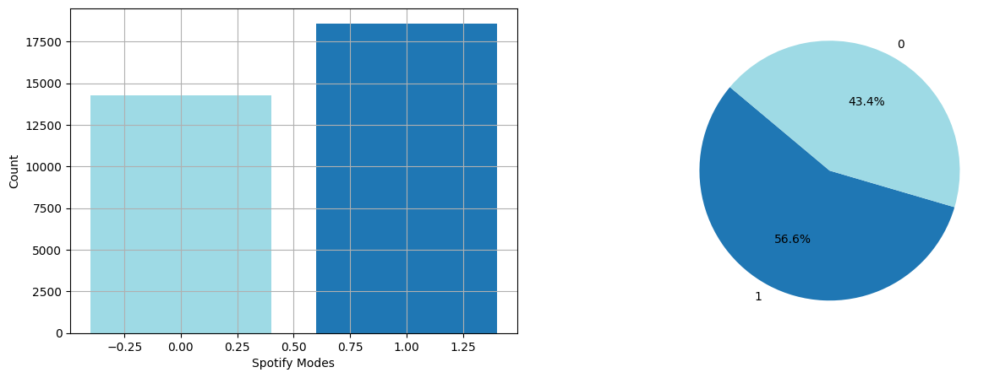

In [16]:
visualize_categories('mode', 'Spotify Modes')

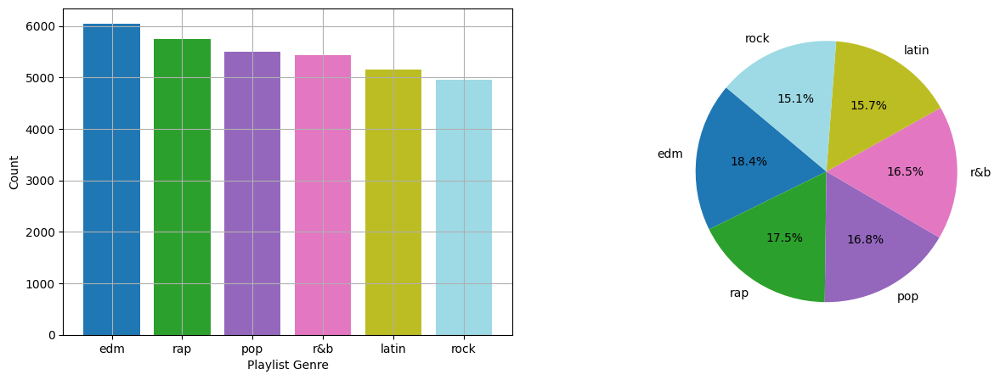

In [17]:
visualize_categories('playlist_genre', 'Playlist Genre')

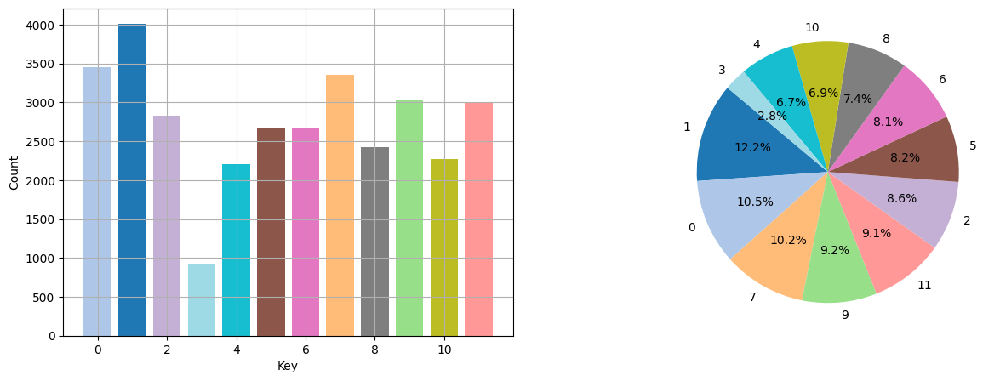

In [18]:
visualize_categories('key', 'Key')

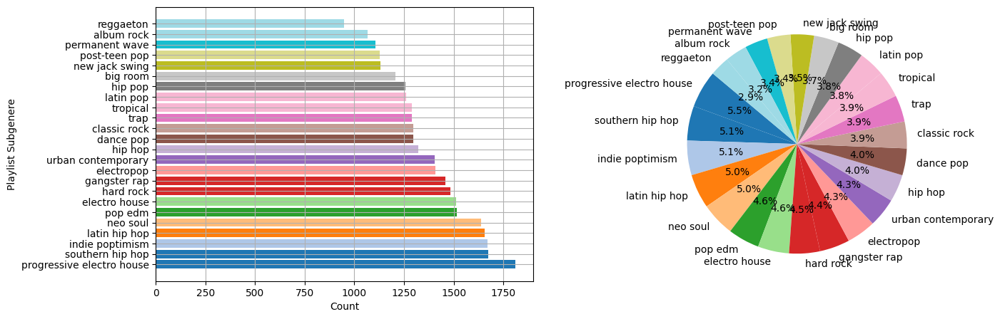

In [19]:
visualize_categories('playlist_subgenre', 'Playlist Subgenere')

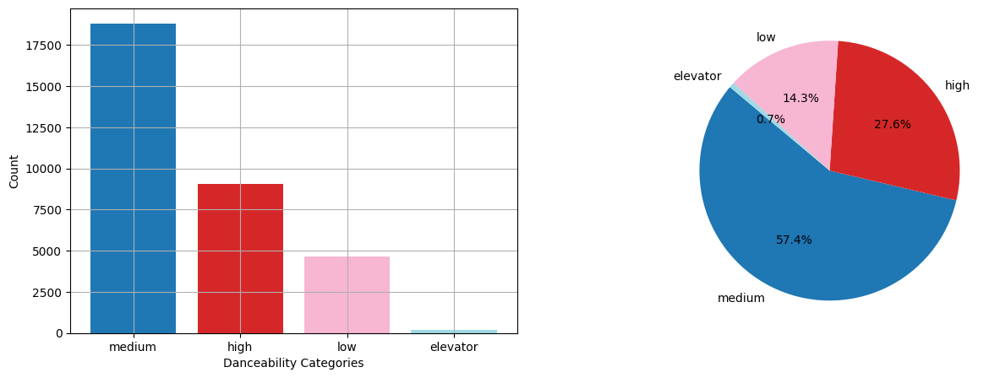

In [20]:
visualize_categories('_danceability_categories', 'Danceability Categories')

<div class="alert alert-block alert-info">
<b>Note:</b> I generally start with categorical data and then move to continuous data.
</div>

##### **B.e.i.** Continuous variables: Histograms or density plots.

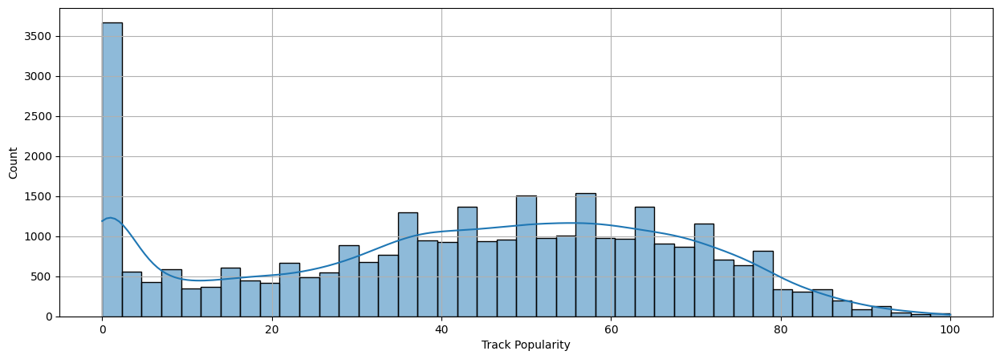

In [21]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='track_popularity', kde=True)
plot.set_xlabel('Track Popularity')
plot.grid(True)

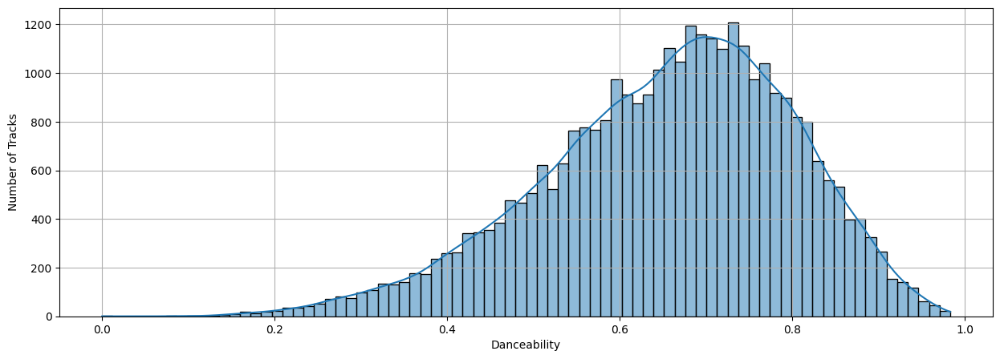

In [22]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='danceability', kde=True)
plot.set_xlabel('Danceability')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

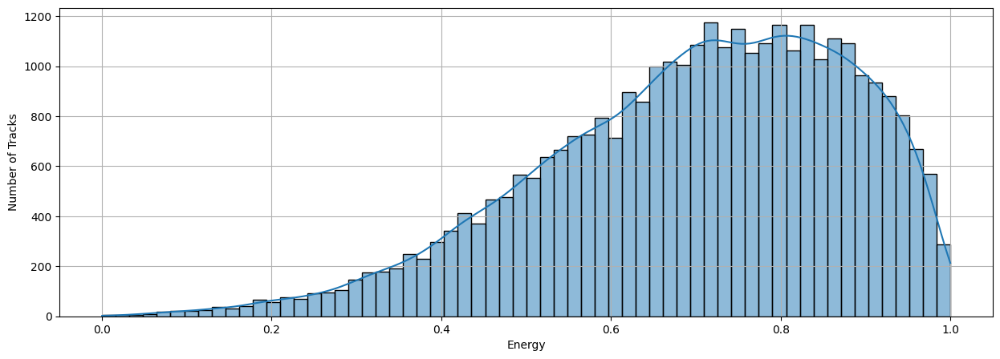

In [23]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='energy', kde=True)
plot.set_xlabel('Energy')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

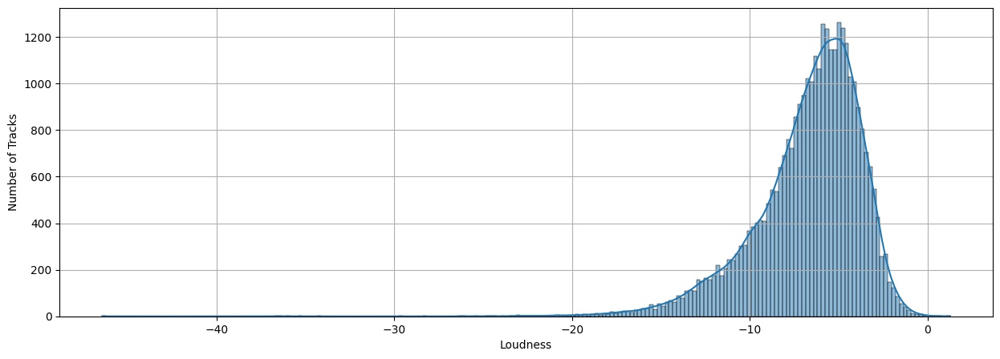

In [24]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='loudness', kde=True)
plot.set_xlabel('Loudness')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

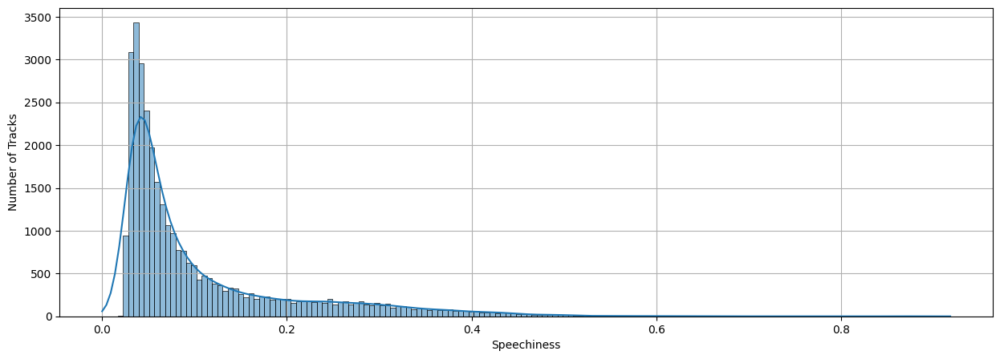

In [25]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='speechiness', kde=True)
plot.set_xlabel('Speechiness')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

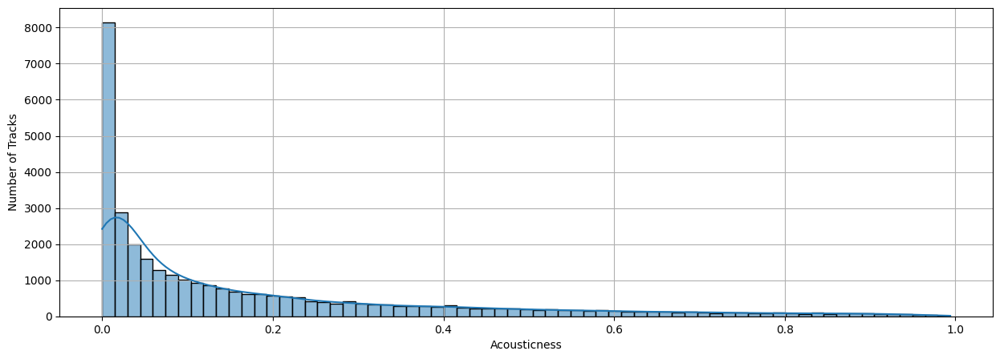

In [26]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='acousticness', kde=True)
plot.set_xlabel('Acousticness')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

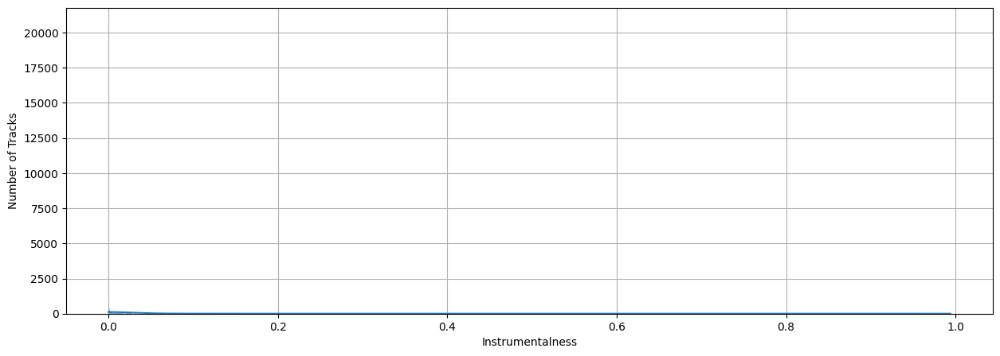

In [27]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='instrumentalness', kde=True)
plot.set_xlabel('Instrumentalness')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

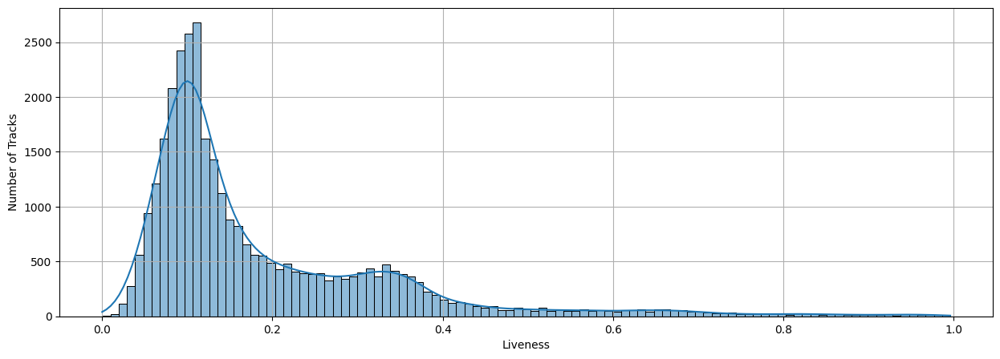

In [28]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='liveness', kde=True)
plot.set_xlabel('Liveness')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

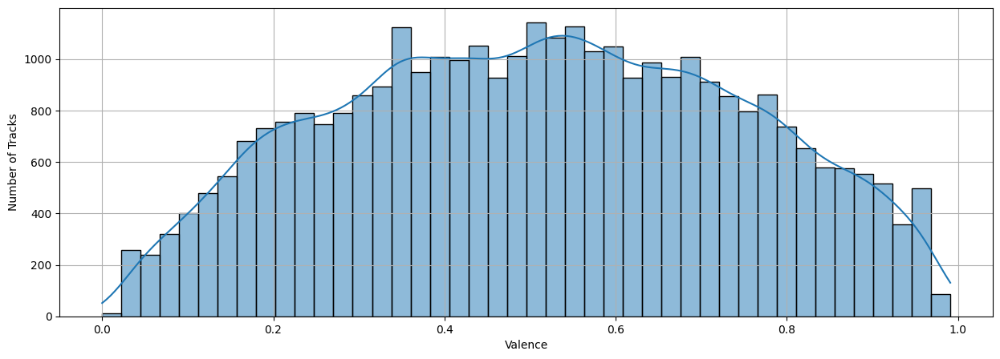

In [29]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='valence', kde=True)
plot.set_xlabel('Valence')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

<div class="alert alert-block alert-info">
<b>Note:</b> Valence is a measurement of emotion in which 0 is closer to music that might be described as sad, depressed, angry, or melancholic. 1 is closer to music that might be described as happy, joyful, euphoric, or cheerful.
<p></p>
<p>Well that's funny, let's deviate and see if we can find something that illustrates that.</p>
</div>

In [30]:
'Sia' in df['track_artist'].values

True

In [31]:
df[df['track_artist'] == 'Sia'].head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,_danceability_categories
45,3C4fzUgIP3ahkhOBdP38GM,Heaven Can Wait - The Aston Shuffle Remix,Sia,61,6fUjIqkNJY56xS62ild7D1,Heaven Can Wait (The Aston Shuffle Remix),2019-05-24,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,-7.626,1,0.0636,0.000609,0.746000,0.0909,0.442,121.968,218373,medium
579,1TVEPho7uQub2pMJyzO8JD,No New Friends - Dombresky Remix,Sia,55,32xFYr17qgtcvVsDqVZHf7,No New Friends (Remixes),2019-05-16,Dance Pop Tunes,4SdfG4cPG3skmTiQLozZGh,pop,...,-4.535,1,0.0657,0.026400,0.812000,0.0953,0.553,125.009,246720,high
581,2VDTgXwf3F6kcpX4HI0BKy,"Heaven Can Wait (feat. Sia, Diplo, and Labrinth)",Sia,62,0ujHQ5WCLuKJQXOqXpGtpf,"LABRINTH, SIA & DIPLO PRESENT... LSD",2019-04-12,Dance Pop Tunes,4SdfG4cPG3skmTiQLozZGh,pop,...,-5.915,0,0.0817,0.034000,0.000026,0.1390,0.533,167.811,195747,medium
1206,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,Pop Inglés (2020 - 2010s)💙 Música En Inglés 2010s,4QAzO1Z92yqqD6Mf3mOANu,pop,...,-5.608,0,0.1050,0.047200,0.001430,0.0907,0.732,89.976,211667,medium
1221,4VrWlk8IQxevMvERoX08iC,Chandelier,Sia,79,3xFSl9lIRaYXIYkIn3OIl9,1000 Forms Of Fear,2014-07-04,Pop Inglés (2020 - 2010s)💙 Música En Inglés 2010s,4QAzO1Z92yqqD6Mf3mOANu,pop,...,-2.880,1,0.0499,0.019700,0.000061,0.0685,0.572,117.089,216120,low


In [32]:
df[df['track_name'] == 'Cheap Thrills']['valence']

1206     0.732
2211     0.732
2566     0.732
2686     0.728
3775     0.732
20507    0.728
23903    0.732
30457    0.728
30637    0.732
Name: valence, dtype: float64

In [33]:
df[df['track_name'] == 'Cheap Thrills']

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,_danceability_categories
1206,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,Pop Inglés (2020 - 2010s)💙 Música En Inglés 2010s,4QAzO1Z92yqqD6Mf3mOANu,pop,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium
2211,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,Post Teen Pop,2Aud8PXoTGcyY5esHu4Aaz,pop,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium
2566,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,Electropop Hits 2017-2020,7kyvBmlc1uSqsTL0EuNLrx,pop,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium
2686,378iszndTZAR4dH8kwsLC6,Cheap Thrills,Sia,63,3Xz1Bcn4YP9bdqlsstMfuJ,This Is Acting,2016-02-18,ELECTROPOP,2UsEj2GUukV0GLbsE3rldz,pop,...,-4.931,0,0.215,0.0561,0.000002,0.0775,0.728,89.972,224813,medium
3775,7BPw9h8vCIX94N0rjFU12S,Cheap Thrills,Sia,61,3Xz1Bcn4YP9bdqlsstMfuJ,This Is Acting,2016-02-18,10er Playlist,1kEczIkZH8IgaWT2BiApxZ,pop,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium
20507,6b3b7lILUJqXcp6w9wNQSm,Cheap Thrills,Sia,68,4BTlXiDFjyJfpHjR7jlEJo,Cheap Thrills,2016-02-11,Latin/Hip Hop/Dancehall/Soca,2rg9LCyvaMQvnCE2hVndpR,latin,...,-4.931,0,0.215,0.0561,0.000002,0.0775,0.728,89.972,224813,medium
23903,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,Today's Hits (Clean),7ENISpOJhocpMJVcGb0qcT,r&b,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium
30457,6b3b7lILUJqXcp6w9wNQSm,Cheap Thrills,Sia,68,4BTlXiDFjyJfpHjR7jlEJo,Cheap Thrills,2016-02-11,2010 - 2011 - 2012 - 2013 - 2014 - 2015 - 2016...,2DjIfVDXGYDgRxw7IJTKVb,edm,...,-4.931,0,0.215,0.0561,0.000002,0.0775,0.728,89.972,224813,medium
30637,27SdWb2rFzO6GWiYDBTD9j,Cheap Thrills,Sia,77,77jAfTh3KH9K2reMOmTgOh,This Is Acting,2016-01-29,2015 songs,6UJw1egIcZVfrBmcKs5uHH,edm,...,-5.608,0,0.105,0.0472,0.001430,0.0907,0.732,89.976,211667,medium


<div class="alert alert-block alert-info">
<b>Note:</b> Even though we counted the unique values for each column it wasn't until now that I realized tracks will repeat themselves in the data. In terms of understanding Valence, I'm a little skeptical, I would say Cheap Thrills by Sia is one of the happiest songs I know! 
</div>

In [34]:
df[df['track_artist'] == 'Lady Gaga']['track_name'].unique()

array(['Poker Face', 'Applause', 'Judas', 'The Cure', 'Bad Romance',
       'Just Dance', 'Paparazzi', 'Alejandro', 'Shallow - Radio Edit',
       'Swine', 'Shallow'], dtype=object)

In [35]:
df[df['track_artist'] == 'Sia']['track_name'].unique()

array(['Heaven Can Wait - The Aston Shuffle Remix',
       'No New Friends - Dombresky Remix',
       'Heaven Can Wait (feat. Sia, Diplo, and Labrinth)',
       'Cheap Thrills', 'Chandelier', 'The Greatest', 'Elastic Heart',
       'Never Give Up', 'Mountains', 'Audio',
       'No New Friends (feat. Sia, Diplo, and Labrinth)',
       'Cheap Thrills Remix', 'Breathe Me', 'Original (from Dolittle)',
       'Move Your Body - Alan Walker Remix'], dtype=object)

In [36]:
df[df['track_artist'] == 'Sia']['playlist_genre'].value_counts()

playlist_genre
pop      19
edm       8
latin     6
r&b       5
Name: count, dtype: int64

In [37]:
df[df['track_artist'] == 'Lady Gaga']['playlist_genre'].value_counts()

playlist_genre
pop      14
edm       5
latin     3
r&b       2
rap       1
Name: count, dtype: int64

In [38]:
df[df['track_artist'] == 'Sia']['playlist_subgenre'].value_counts()

playlist_subgenre
electropop                   9
dance pop                    6
pop edm                      6
latin hip hop                5
hip pop                      4
post-teen pop                3
indie poptimism              1
latin pop                    1
urban contemporary           1
electro house                1
progressive electro house    1
Name: count, dtype: int64

In [39]:
df[df['track_artist'] == 'Lady Gaga']['playlist_subgenre'].value_counts()

playlist_subgenre
post-teen pop         10
pop edm                5
latin hip hop          3
electropop             2
dance pop              1
indie poptimism        1
southern hip hop       1
urban contemporary     1
hip pop                1
Name: count, dtype: int64

##### **B.f.i.** Categorical-to-continuous relationships.

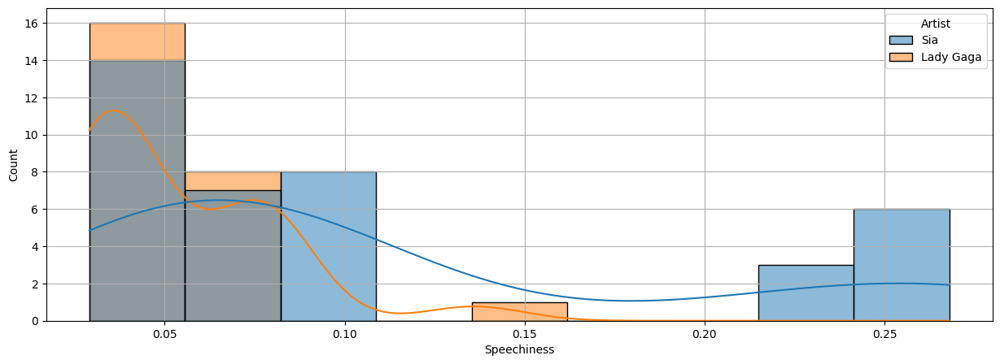

In [40]:
sia_vs_gaga_df = df[(df['track_artist'] == 'Sia') | (df['track_artist'] == 'Lady Gaga')]

plt.figure(figsize=(15, 5))
plot = sns.histplot(data=sia_vs_gaga_df, x='speechiness', hue='track_artist', kde=True)
plot.set_xlabel('Speechiness')
plot.grid(True)

plot.legend_.set_title('Artist')

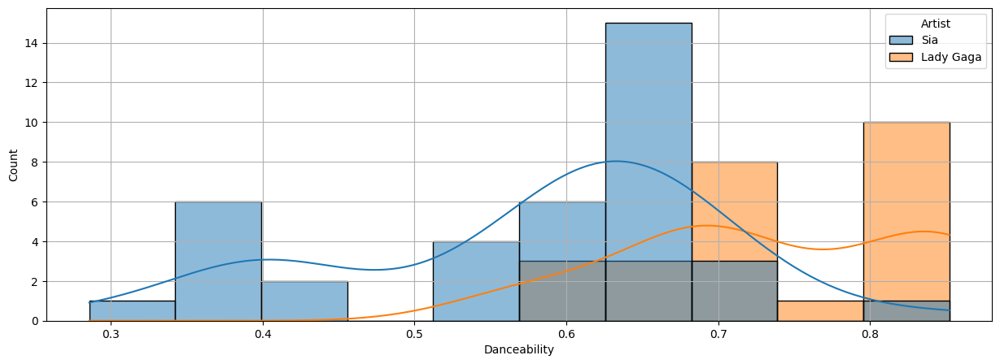

In [41]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=sia_vs_gaga_df, x='danceability', hue='track_artist', kde=True)
plot.set_xlabel('Danceability')
plot.grid(True)

plot.legend_.set_title('Artist')

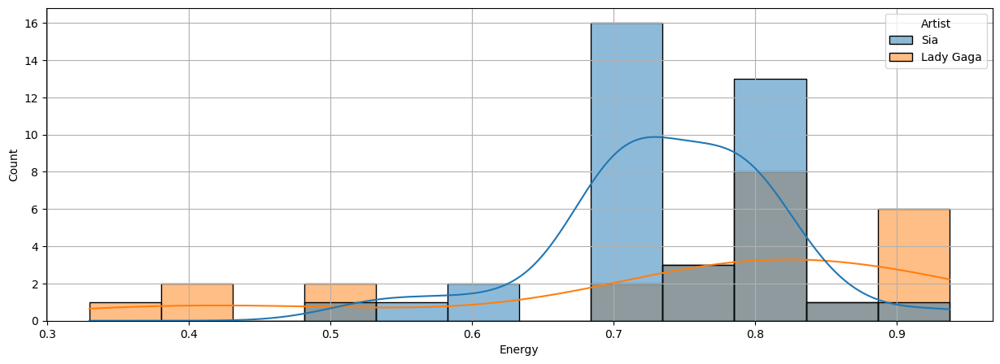

In [42]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=sia_vs_gaga_df, x='energy', hue='track_artist', kde=True)
plot.set_xlabel('Energy')
plot.grid(True)

plot.legend_.set_title('Artist')

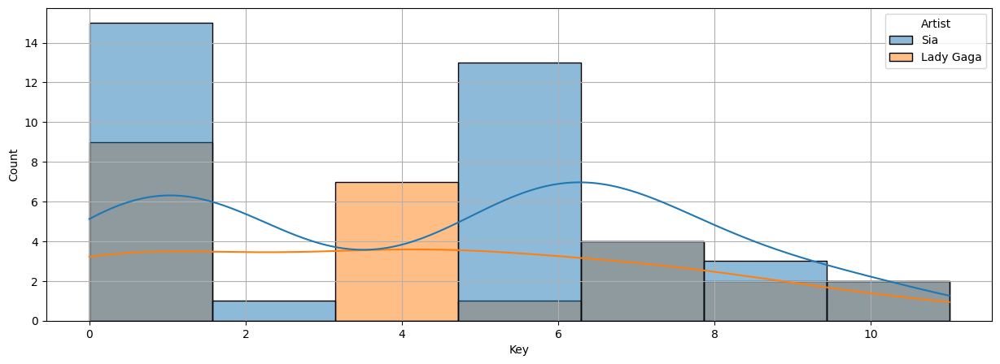

In [43]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=sia_vs_gaga_df, x='key', hue='track_artist', kde=True)
plot.set_xlabel('Key')
plot.grid(True)

plot.legend_.set_title('Artist')

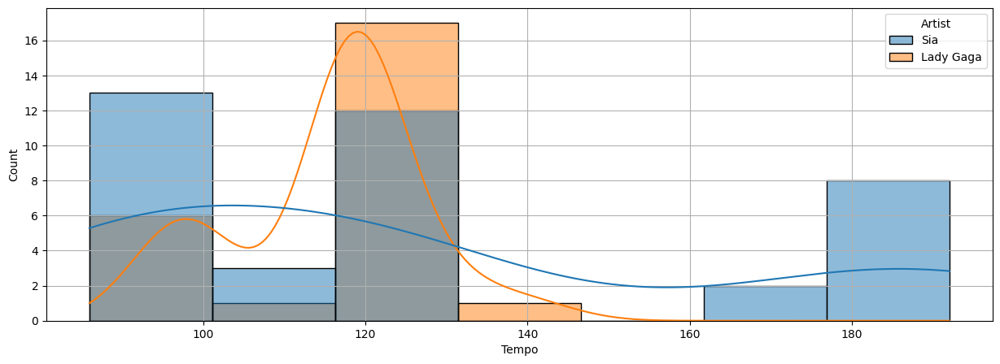

In [44]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=sia_vs_gaga_df, x='tempo', hue='track_artist', kde=True)
plot.set_xlabel('Tempo')
plot.grid(True)

plot.legend_.set_title('Artist')

<div class="alert alert-block alert-info">
<b>Note:</b> And there's my justification, Sia's speechiness and tempo have a greater range than Lady Gaga's and that, to me, is an indicator of her diversity while Lady Gaga just sounds the same across her music. Maybe I suffer from confirmation bias!
</div>

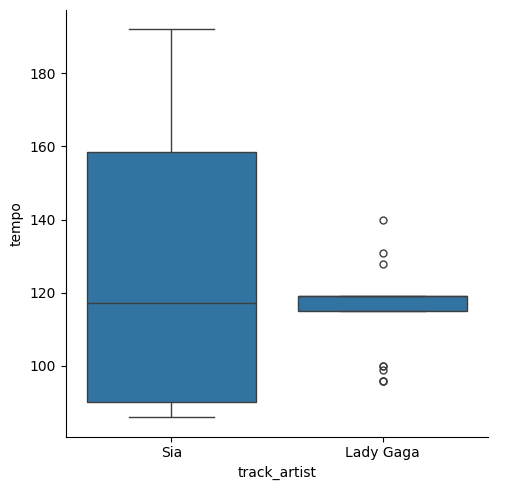

In [45]:
sns.catplot(data=sia_vs_gaga_df, x='track_artist', y='tempo', kind='box');

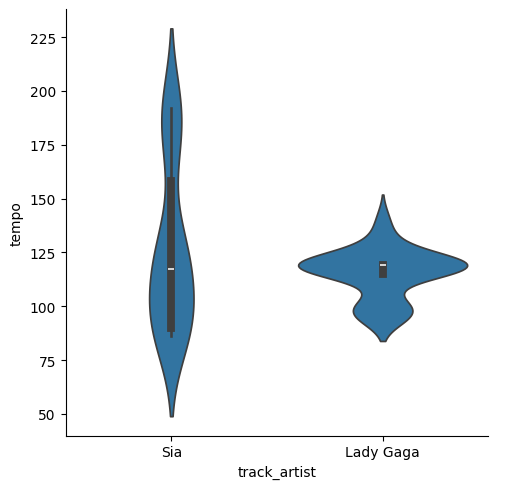

In [46]:
sns.catplot(data=sia_vs_gaga_df, x='track_artist', y='tempo', kind='violin');

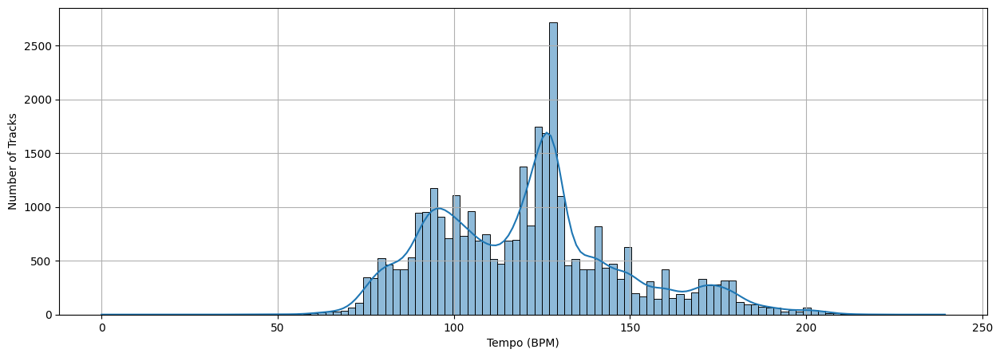

In [47]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='tempo', kde=True)
plot.set_xlabel('Tempo (BPM)')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

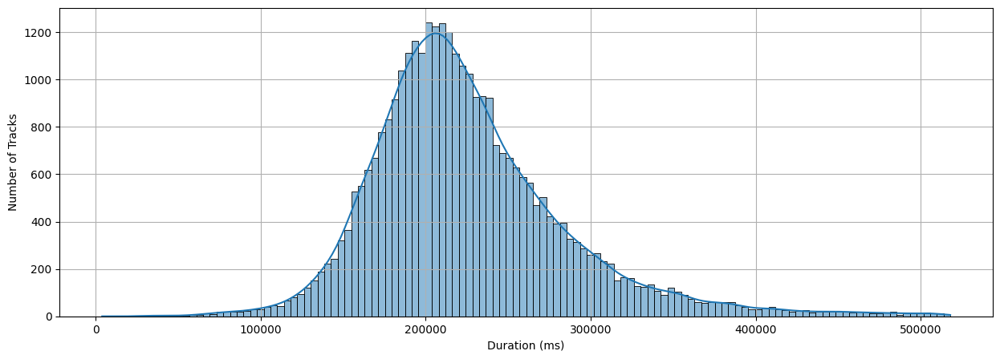

In [48]:
plt.figure(figsize=(15, 5))
plot = sns.histplot(data=df, x='duration_ms', kde=True)
plot.set_xlabel('Duration (ms)')
plot.set_ylabel('Number of Tracks')
plot.grid(True)

##### **B.f.i.** Categorical-to-categorical relationships (COMBINATIONS)

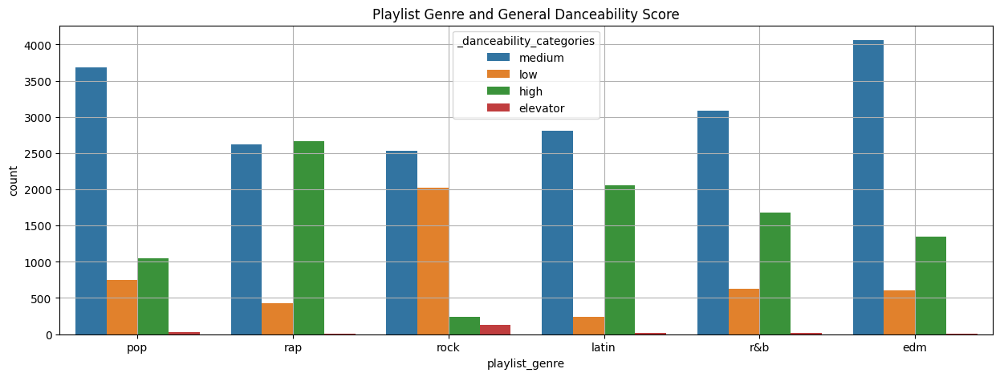

In [49]:
plt.figure(figsize=(15, 5))
sns.countplot(x='playlist_genre', hue='_danceability_categories', data=df)
plt.title('Playlist Genre and General Danceability Score')
plt.grid(True)
plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> I'm suprised edm doesn't have more "high" danceable songs, though they do have the highest count of medium danceable songs.
</div>

##### **B.f.iii.** Continuous-to-continuous relationships.

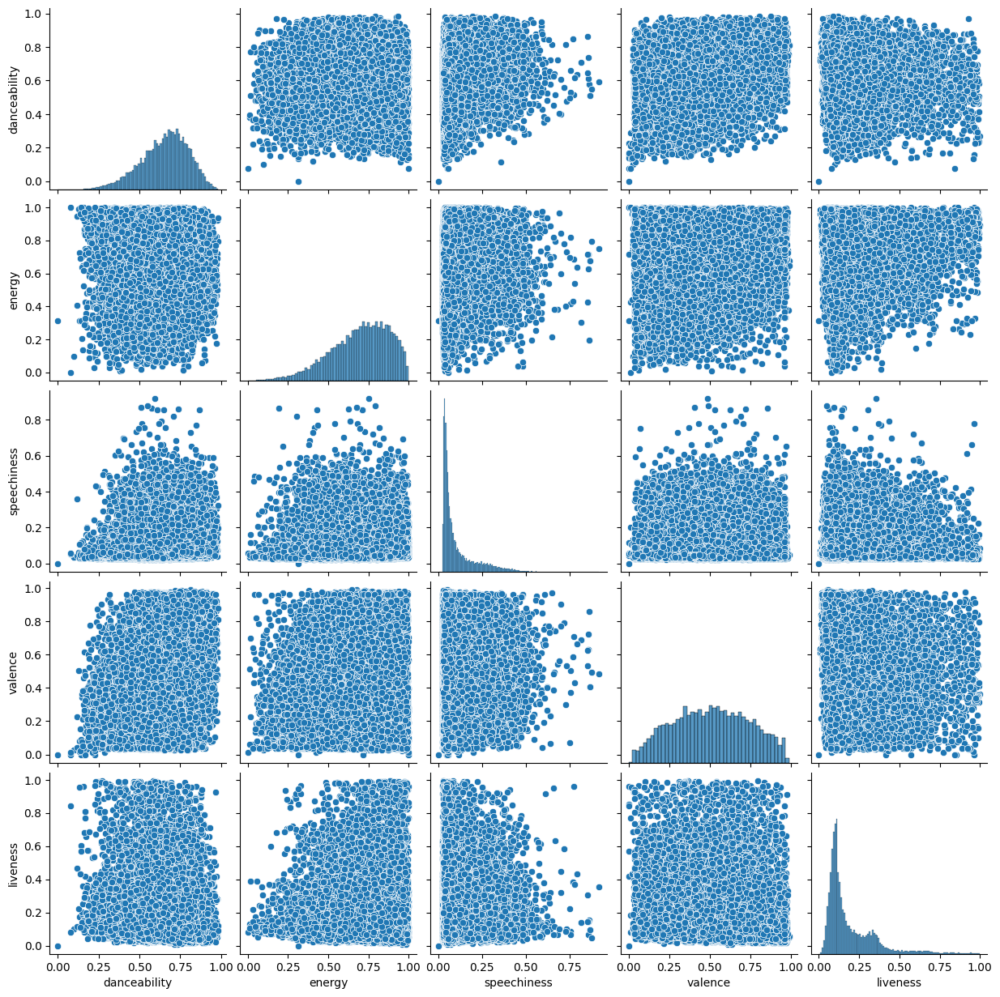

In [50]:
sns.pairplot(data=df[primary_continuous_variables[0:5]]);

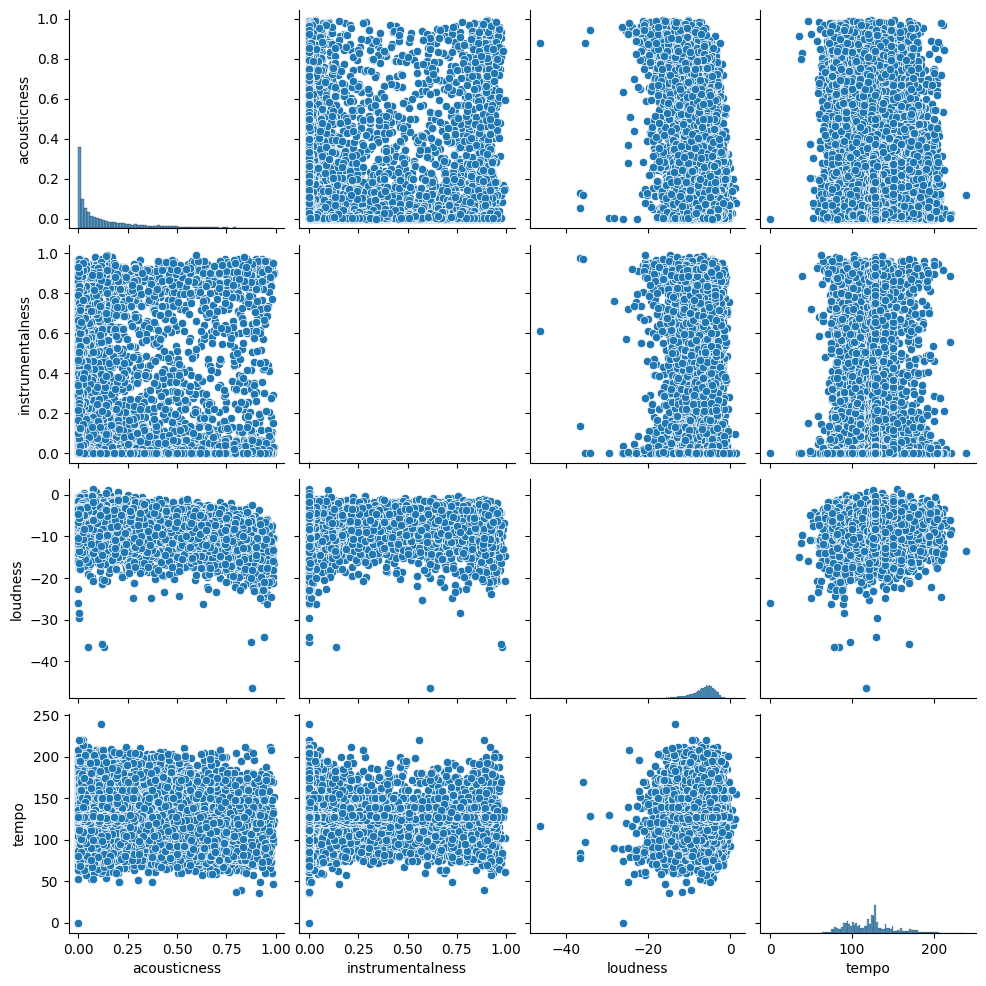

In [51]:
sns.pairplot(data=df[primary_continuous_variables[5:-1]]);

In [52]:
corr = df[['track_popularity','danceability','energy','speechiness','valence','liveness','acousticness','instrumentalness','loudness','tempo','duration_ms']].corr()
corr

,track_popularity,danceability,energy,speechiness,valence,liveness,acousticness,instrumentalness,loudness,tempo,duration_ms
track_popularity,1.000000,0.064748,-0.109112,0.006819,0.033231,-0.054584,0.085159,-0.149872,0.057687,-0.005378,-0.143682
danceability,0.064748,1.000000,-0.086073,0.181721,0.330523,-0.123859,-0.024519,-0.008655,0.025335,-0.184084,-0.096879
energy,-0.109112,-0.086073,1.000000,-0.032150,0.151103,0.161223,-0.539745,0.033247,0.676625,0.149951,0.012611
speechiness,0.006819,0.181721,-0.032150,1.000000,0.064659,0.055426,0.026092,-0.103424,0.010339,0.044603,-0.089431
valence,0.033231,0.330523,0.151103,0.064659,1.000000,-0.020560,-0.016845,-0.175402,0.053384,-0.025732,-0.032225
liveness,-0.054584,-0.123859,0.161223,0.055426,-0.020560,1.000000,-0.077243,-0.005507,0.077613,0.021018,0.006138
acousticness,0.085159,-0.024519,-0.539745,0.026092,-0.016845,-0.077243,1.000000,-0.006850,-0.361638,-0.112724,-0.081581
instrumentalness,-0.149872,-0.008655,0.033247,-0.103424,-0.175402,-0.005507,-0.006850,1.000000,-0.147824,0.023335,0.063235
loudness,0.057687,0.025335,0.676625,0.010339,0.053384,0.077613,-0.361638,-0.147824,1.000000,0.093767,-0.115058
tempo,-0.005378,-0.184084,0.149951,0.044603,-0.025732,0.021018,-0.112724,0.023335,0.093767,1.000000,-0.001412


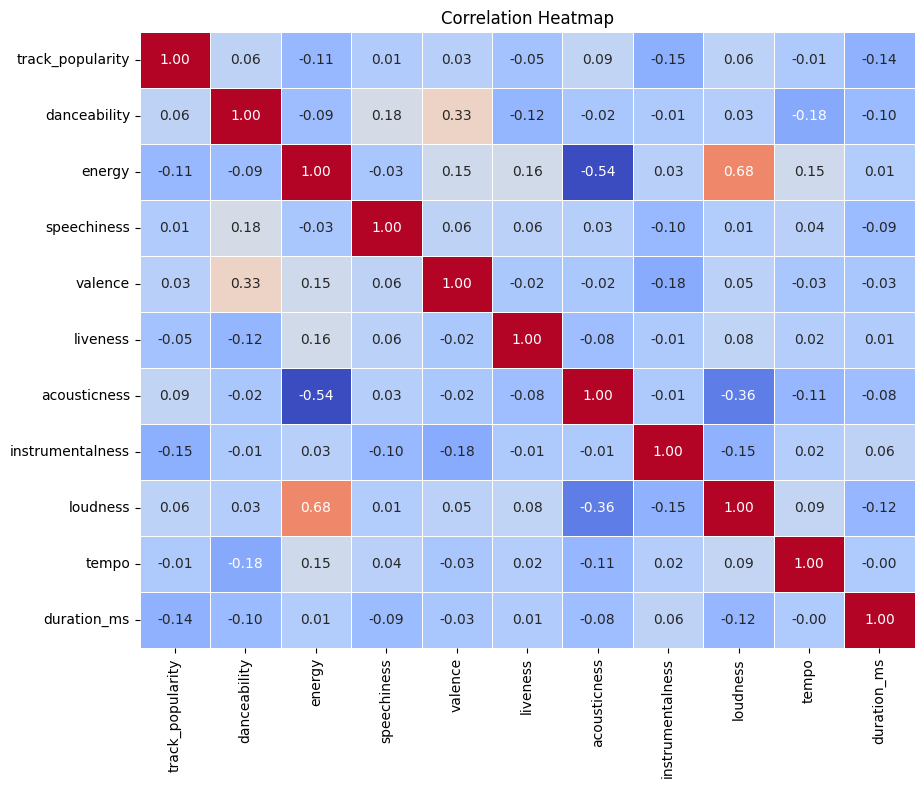

In [53]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, annot_kws={'size': 10}, fmt=".2f", cmap='coolwarm',
            cbar_kws={'shrink': .8}, linewidths=.5, cbar=False)
plt.title('Correlation Heatmap')
plt.show()

##### **B.g.** You must decide appropriate visualizations to show if RELATIONSHIPS change across GROUPS. This is especially important to continuous-to-continuous relationships. Do not forget though that categorical-to-continuous relationships can also be GROUPED BY a secondary categorical variable!

##### **B.h.i.** Visualize the relationship between the continuous response and the continuous inputs using scatter plots and trend plots.

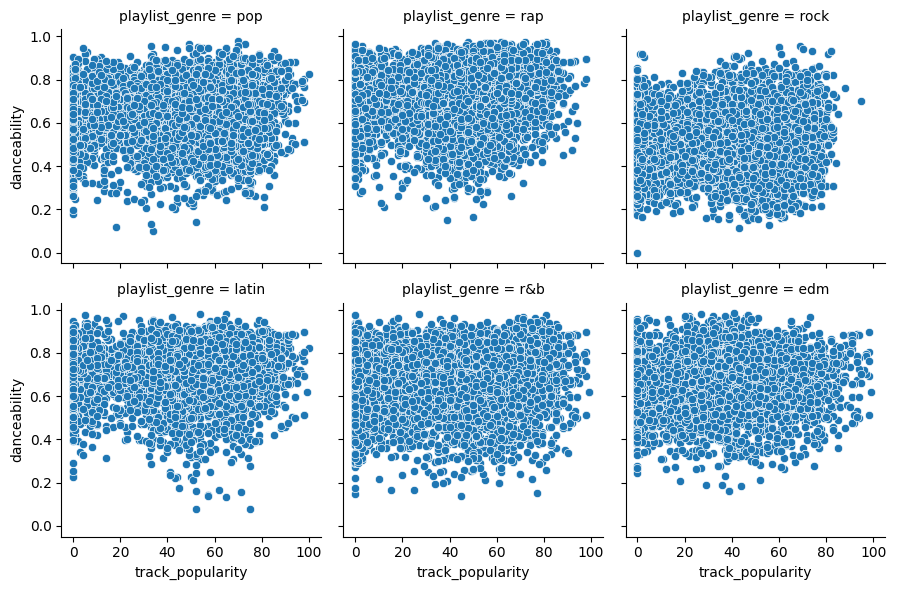

In [54]:
fc = sns.FacetGrid(df, col='playlist_genre', col_wrap=3)
fc.map(sns.scatterplot, 'track_popularity', 'danceability')
fc.add_legend()
plt.show()

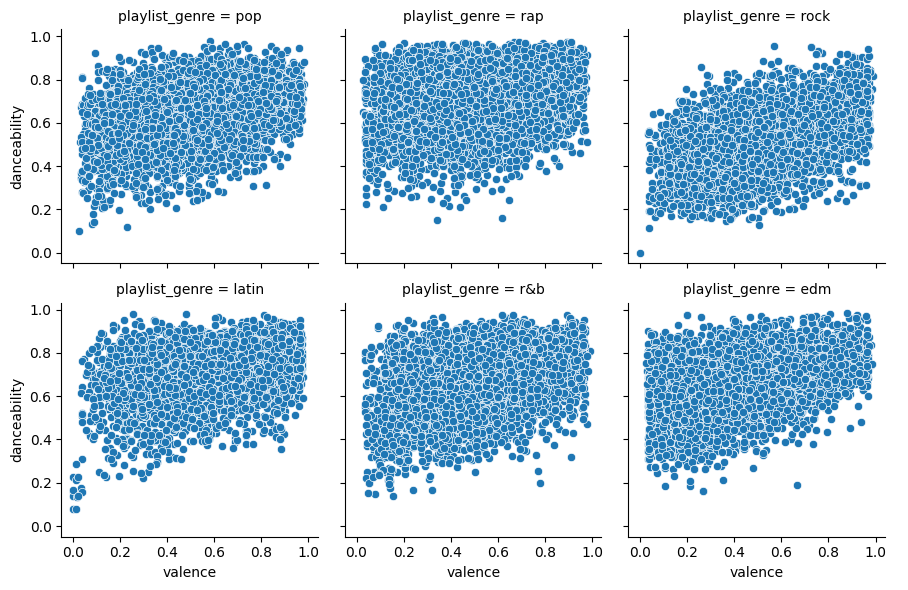

In [55]:
fc = sns.FacetGrid(df, col='playlist_genre', col_wrap=3)
fc.map(sns.scatterplot, 'valence', 'danceability')
fc.add_legend()
plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> The rock category does seem to provide a slighly more correlated relationship between danceability and valence, though nothings popping out at me.
</div>

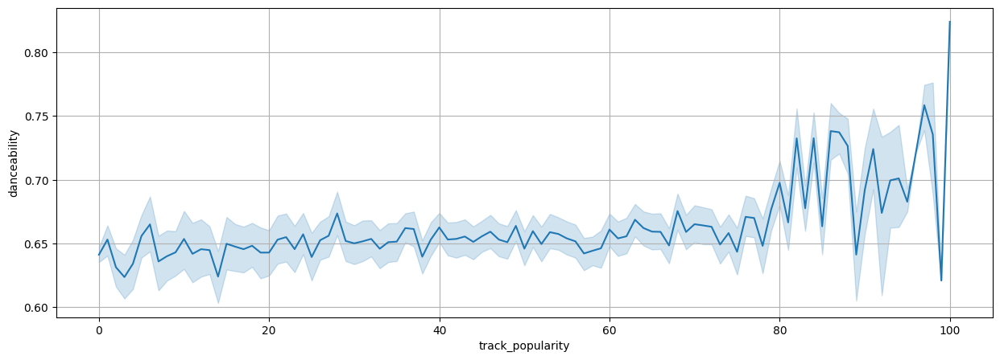

In [56]:
plt.figure(figsize=(15, 5))
plot = sns.lineplot(x='track_popularity', y='danceability', data=df)
plot.grid(True)

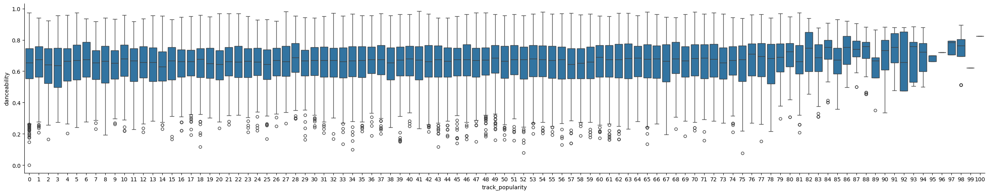

In [57]:
sns.catplot(data=df, x='track_popularity', y='danceability', kind='box', aspect=5);

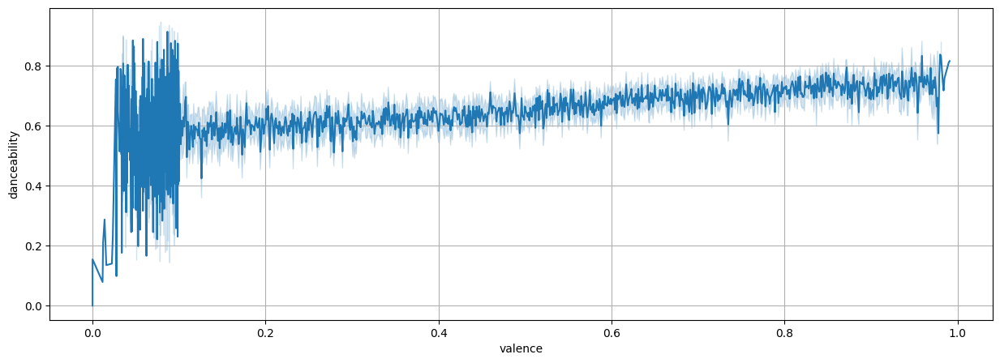

In [58]:
plt.figure(figsize=(15, 5))
plot = sns.lineplot(x='valence', y='danceability', data=df)
plot.grid(True)

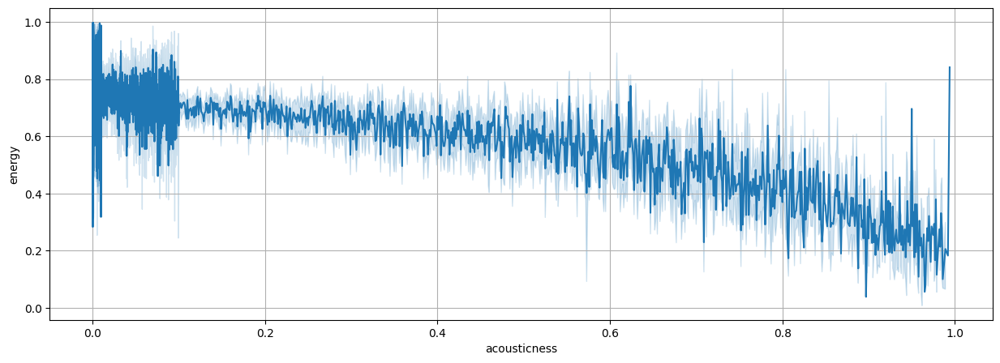

In [59]:
plt.figure(figsize=(15, 5))
plot = sns.lineplot(x='acousticness', y='energy', data=df)
plot.grid(True)

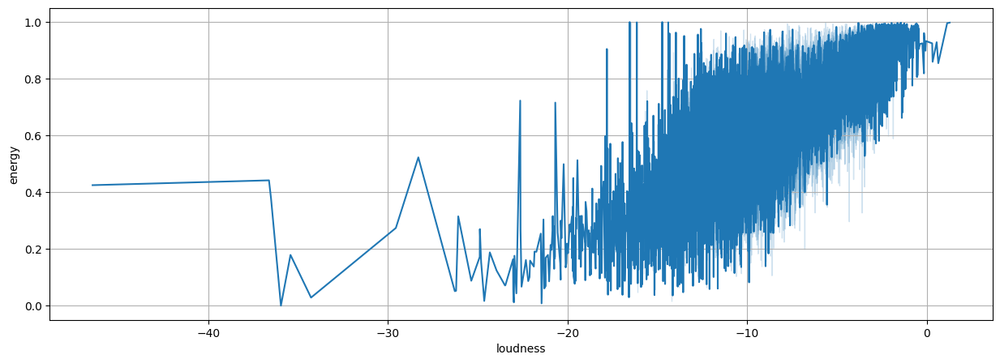

In [60]:
plt.figure(figsize=(15, 5))
plot = sns.lineplot(x='loudness', y='energy', data=df)
plot.grid(True)

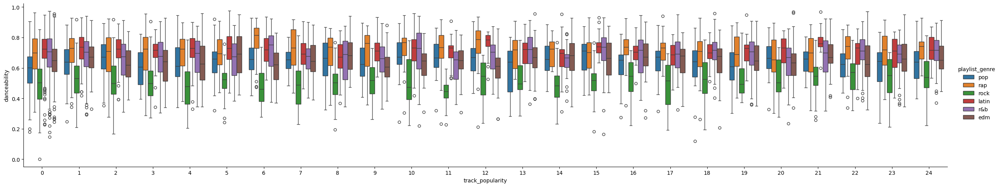

In [61]:
sns.catplot(data=df[df['track_popularity'] < 25], x='track_popularity', y='danceability', kind='box', hue='playlist_genre', aspect=5);

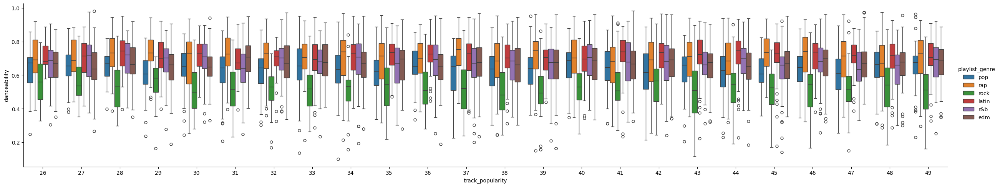

In [62]:
sns.catplot(data=df[(df['track_popularity'] > 25) & (df['track_popularity'] < 50)], x='track_popularity', y='danceability', kind='box', hue='playlist_genre', aspect=5);

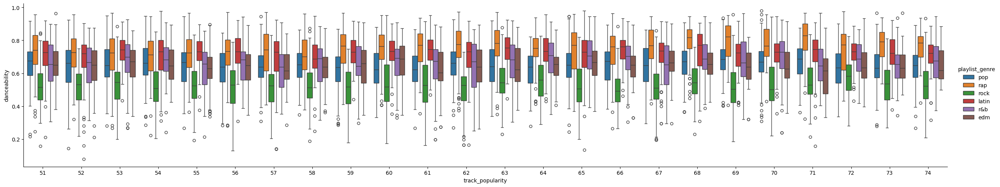

In [63]:
sns.catplot(data=df[(df['track_popularity'] > 50) & (df['track_popularity'] < 75)], x='track_popularity', y='danceability', kind='box', hue='playlist_genre', aspect=5);

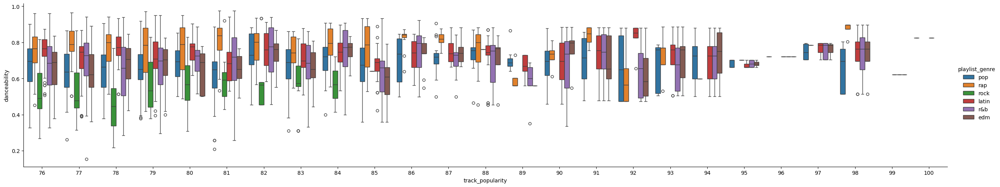

In [64]:
sns.catplot(data=df[df['track_popularity'] > 75], x='track_popularity', y='danceability', kind='box', hue='playlist_genre', aspect=5);

<div class="alert alert-block alert-info">
<b>Note:</b> Since there were too many data points, I split them into 4 equal sections and used boolean indexing to provide the filters.
</div>

##### **B.h.ii.** Group the relationships by categorical variables (if appropriate).

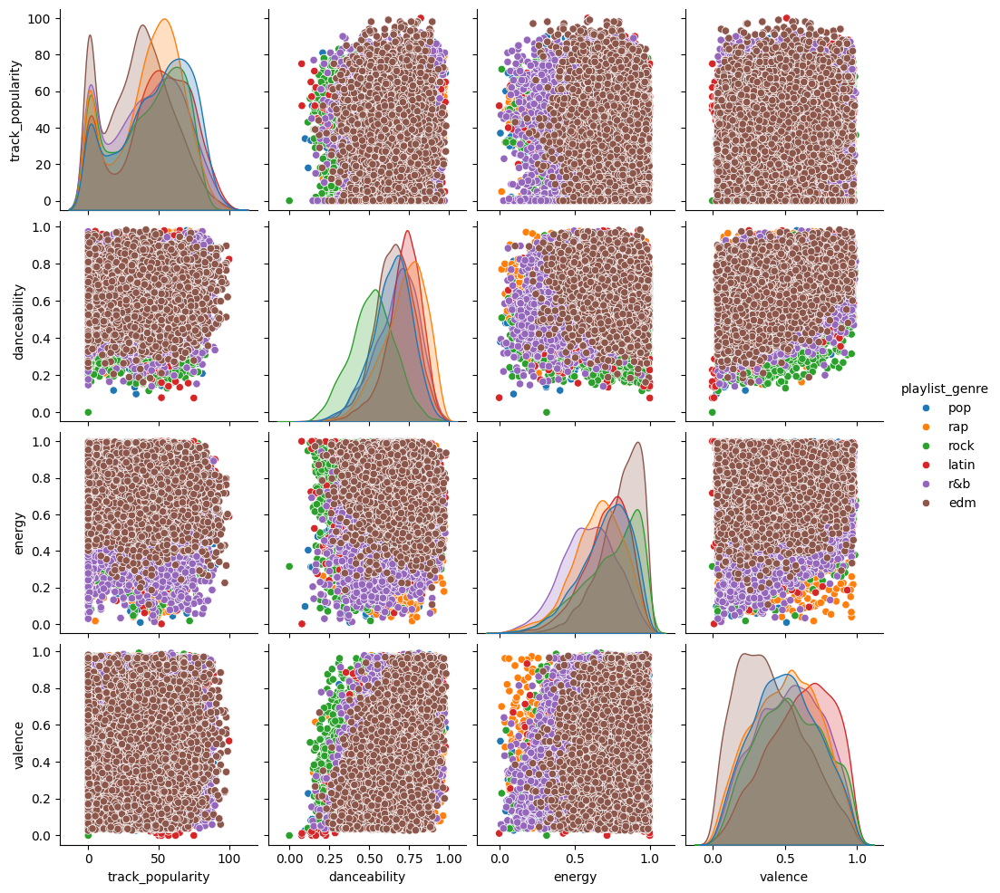

In [65]:
sns.pairplot(data=df[['track_popularity', 'danceability', 'energy', 'valence', 'playlist_genre']], hue='playlist_genre')
plt.show()

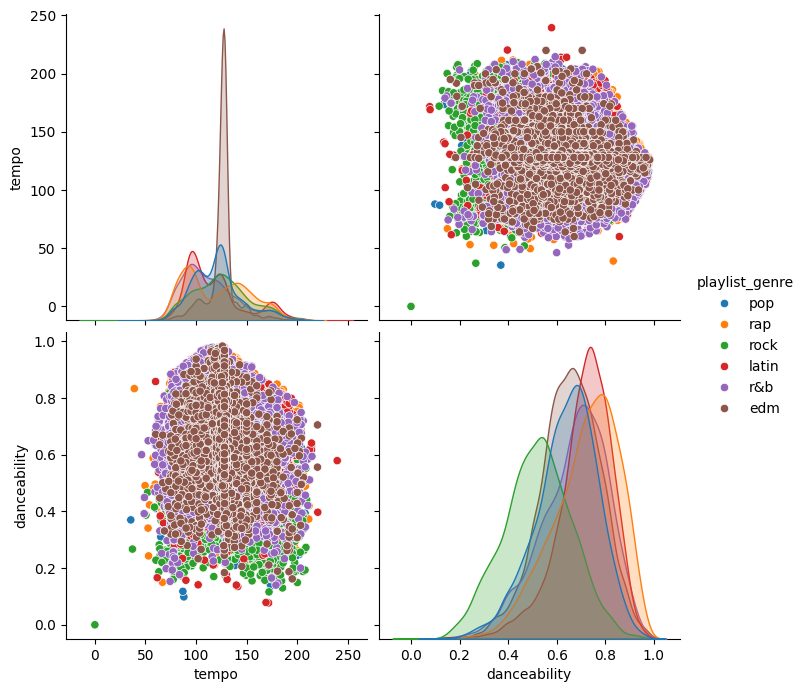

In [66]:
sns.pairplot(data=df[['tempo', 'danceability', 'playlist_genre']], hue='playlist_genre', height=3.5, aspect=1)
plt.show()

##### **B.h.iii.** Summarize the response for each unique value of the categorical inputs using boxplots, violin plots, and point plots. 

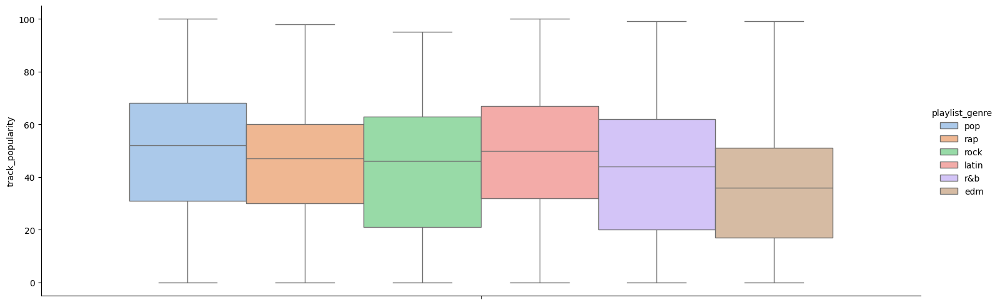

In [67]:
sns.catplot(data=df, y='track_popularity', kind='box', hue='playlist_genre', aspect=3, palette='pastel');

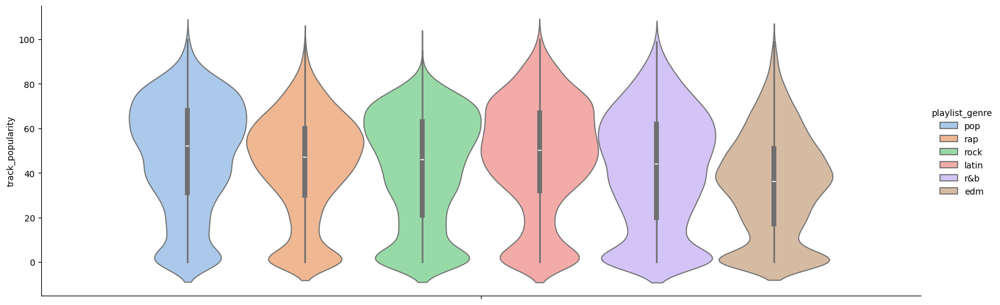

In [68]:
sns.catplot(data=df, y='track_popularity', kind='violin', hue='playlist_genre', aspect=3, palette='pastel');

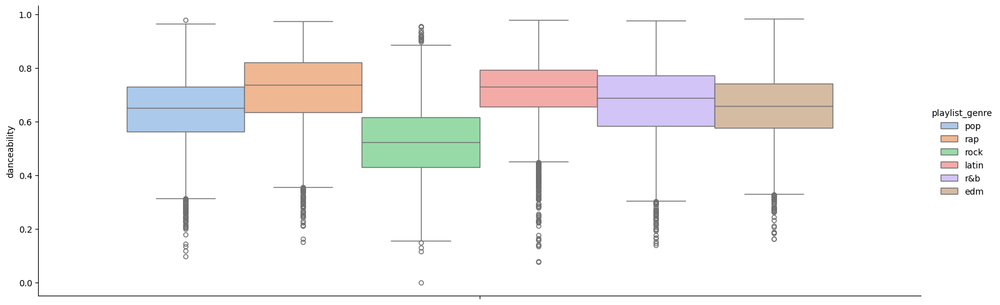

In [69]:
sns.catplot(data=df, y='danceability', kind='box', hue='playlist_genre', aspect=3, palette='pastel');

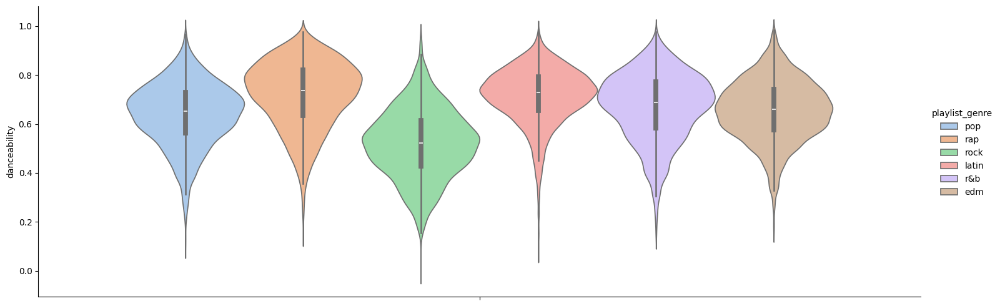

In [70]:
sns.catplot(data=df, y='danceability', kind='violin', hue='playlist_genre', aspect=3, palette='pastel');

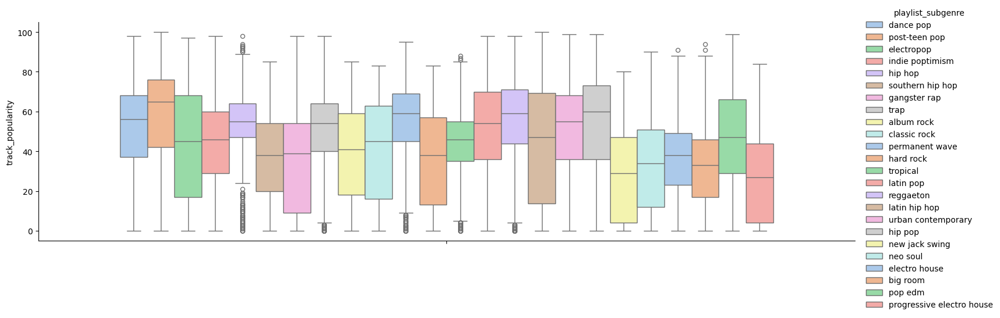

In [71]:
sns.catplot(data=df, y='track_popularity', kind='box', hue='playlist_subgenre', aspect=3, palette='pastel');

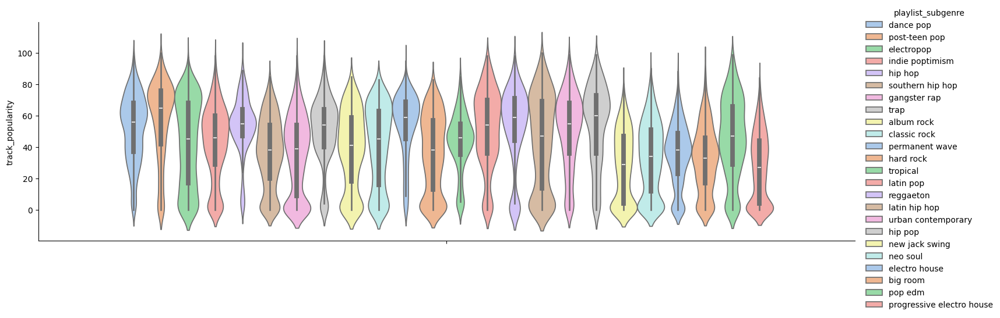

In [72]:
sns.catplot(data=df, y='track_popularity', kind='violin', hue='playlist_subgenre', aspect=3, palette='pastel');

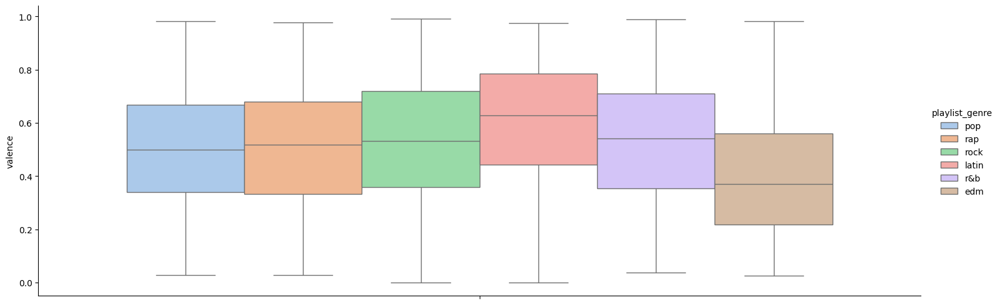

In [73]:
sns.catplot(data=df, y='valence', kind='box', hue='playlist_genre', aspect=3, palette='pastel');

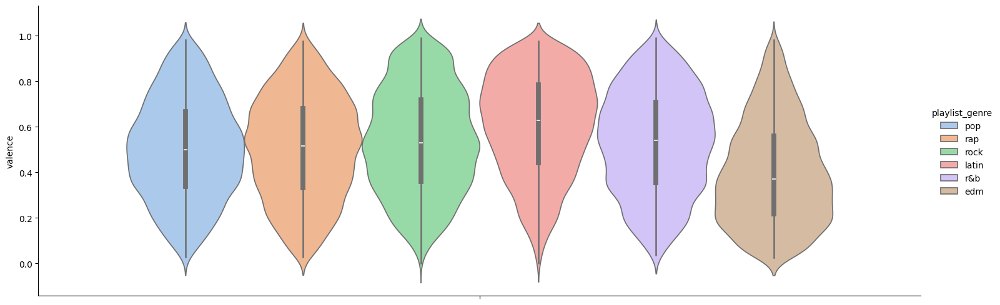

In [74]:
sns.catplot(data=df, y='valence', kind='violin', hue='playlist_genre', aspect=3, palette='pastel');

<div class="alert alert-block alert-info">
<b>Note:</b> Looks like Latin playlists have the highest concentration of happy songs. Me encanta la musica.
</div>

<Axes: xlabel='playlist_genre', ylabel='track_popularity'>

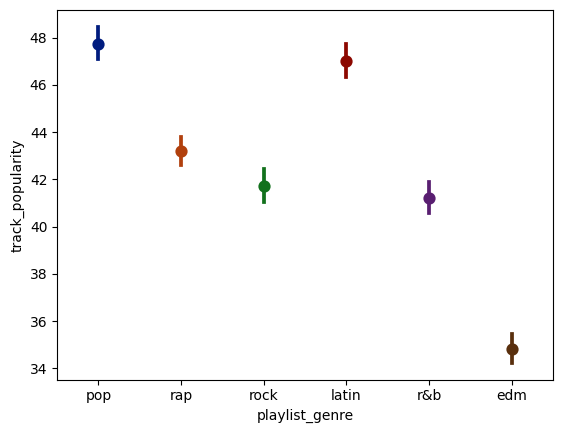

In [75]:
sns.pointplot(data=df, x='playlist_genre', y='track_popularity', palette='dark')

<div class="alert alert-block alert-info">
<b>Note:</b> There is a statistically significant difference in track popularity between their genres (but not for all genres). Interesting.
</div>

<Axes: xlabel='playlist_genre', ylabel='tempo'>

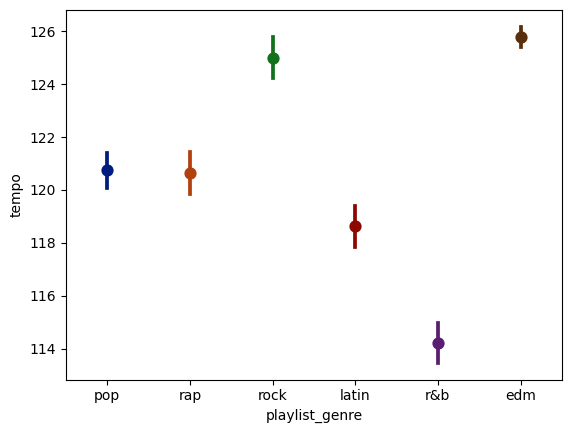

In [76]:
sns.pointplot(data=df, x='playlist_genre', y='tempo', palette='dark')

<Axes: xlabel='playlist_genre', ylabel='valence'>

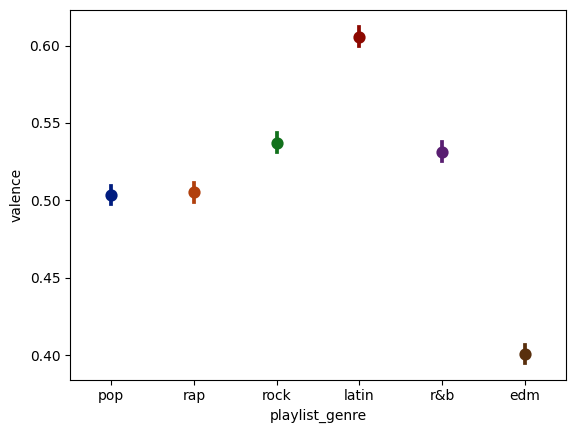

In [77]:
sns.pointplot(data=df, x='playlist_genre', y='valence', palette='dark')

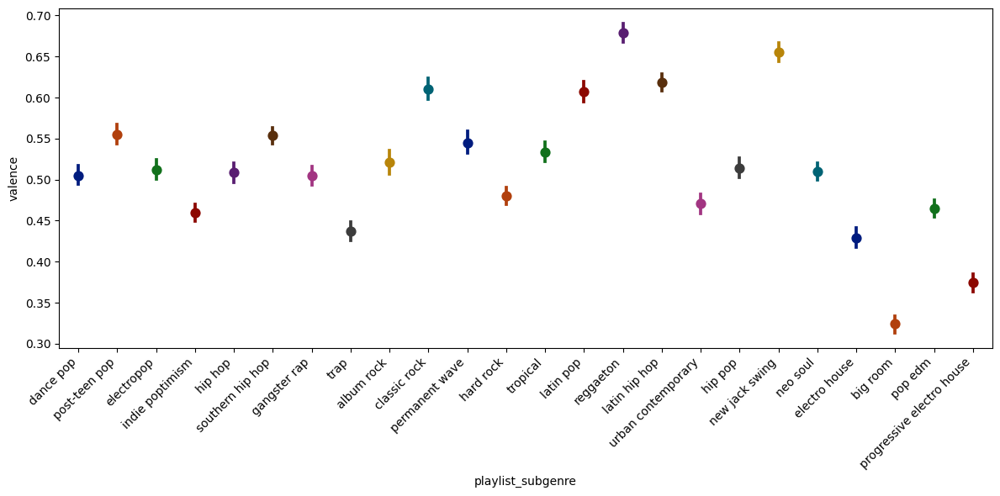

In [78]:
plt.figure(figsize=(12, 6))
ax = sns.pointplot(data=df, x='playlist_subgenre', y='valence', palette='dark')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

##### **C.a.** Select variables. You MUST state which class of variables you used in your cluster analysis. For example, you could:

##### **C.a.i.** Cluster using CONTINUOUS inputs.

<div class="alert alert-block alert-success">
<b>Answer:</b> tempo and valence for the first cluster, track_popularity and danceability for the second cluster.
</div>

##### **C.b.i** How many variables are you using relative to the number of observations?

<div class="alert alert-block alert-success">
<b>Answer:</b> Roughly 1 variable for every 16416 observations
</div>

##### **C.b.ii** Are the variables you are using “Gaussian-like” or are the distributions “odd looking”? You must visualize the MARGINAL histograms of the variables IF you are using summary statistics derived from INPUTS or OUTPUTS. If you are using the INPUTS or OUTPUTS directly, you already visualized the MARGINAL distributions.

<div class="alert alert-block alert-success">
<b>Answer:</b> Already visualized, refer to section <b>B.e.i.</b> I would say valence is the most normally distributed out of the four: valence, tempo, track_popularity, and danceability.
</div>

##### **C.b.iii** Are the variables you are using highly correlated to each other? You must visualize the relationships between the variables you are using. If you are using the INPUTS/OUTPUTS directly then you already visualized those relationships.

<div class="alert alert-block alert-success">
<b>Answer:</b> Already visualized, refer to section <b>B.f.iii.</b> They are not highly correlated, suprisingly.
</div>

##### **C.b.iv** How should you handle missing values? If you drop all rows with at least one missing value, how many observations would you still have (thus, how many complete cases do you have)? 

In [79]:
df[['track_popularity', 'danceability', 'tempo', 'valence']].isna().sum()

track_popularity    0
danceability        0
tempo               0
valence             0
dtype: int64

<div class="alert alert-block alert-success">
<b>Answer:</b> No missing values, would have dropped the row entirely if there were.
</div>

##### **C.d.i**  First, use 2 clusters and Count the number of observations per identified cluster. Are the clusters balanced?

In [80]:
k = 2

kmeans = KMeans(n_clusters=k, random_state=0)
df['tempo_valence_cluster'] = kmeans.fit_predict(df[['tempo', 'valence']])
df['track_popularity_danceability_cluster'] = kmeans.fit_predict(df[['track_popularity', 'danceability']])

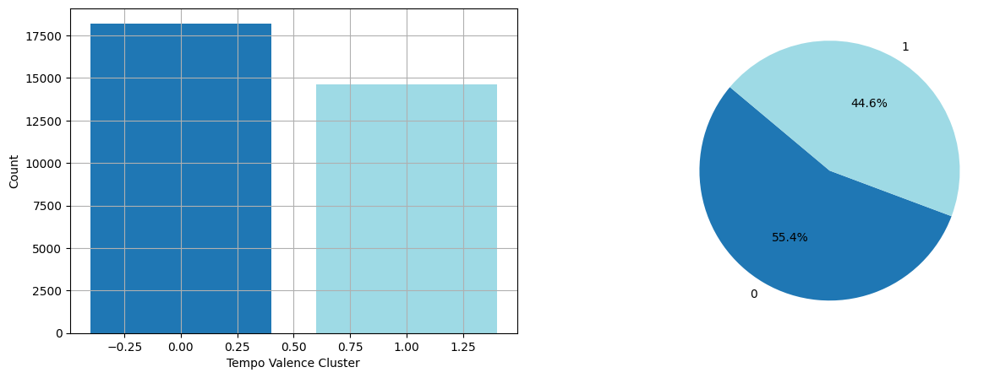

In [81]:
visualize_categories('tempo_valence_cluster', 'Tempo Valence Cluster')

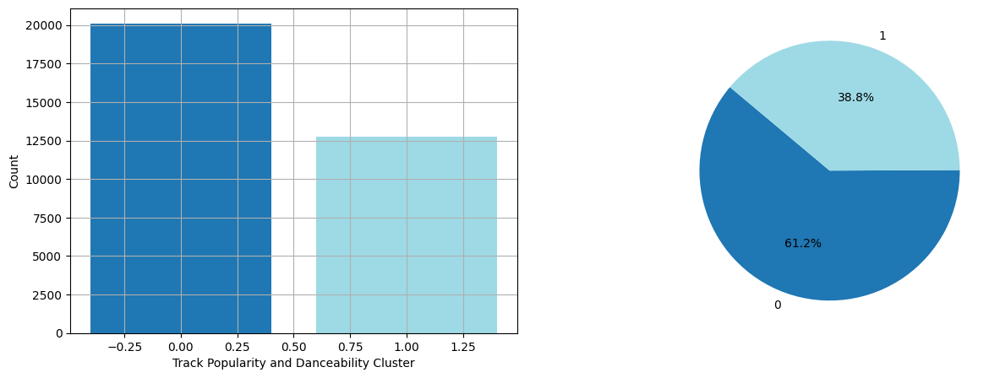

In [82]:
visualize_categories('track_popularity_danceability_cluster', 'Track Popularity and Danceability Cluster')

<div class="alert alert-block alert-info">
<b>Note:</b> Previously defined function is used again, let's go!! My first cluster is more balanced than my second, but neither seem to be perfectly balanced.
</div>

##### **C.d.ii.** Visualize the cluster results between 2 of the variables used for the cluster analysis

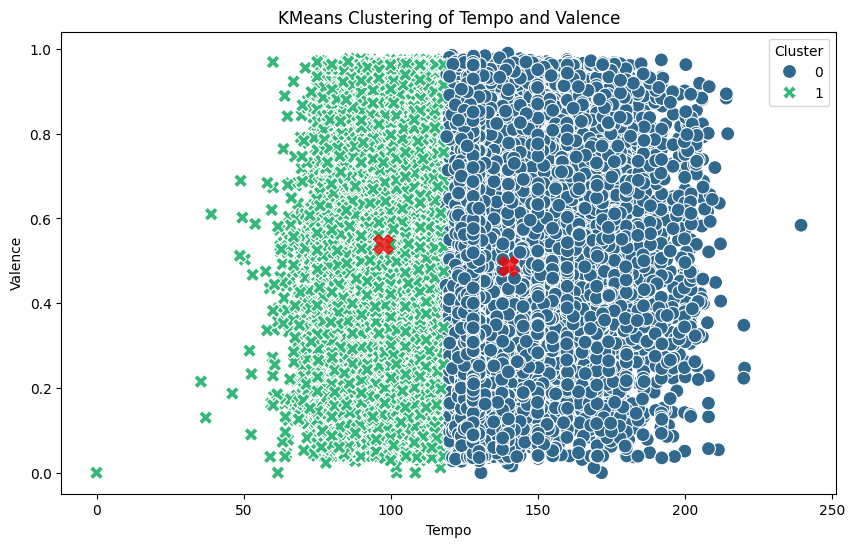

In [83]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='tempo', y='valence', hue='tempo_valence_cluster', data=df, palette='viridis', style='tempo_valence_cluster', s=100)

kmeans.fit_predict(df[['tempo', 'valence']])
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='X')

plt.title('KMeans Clustering of Tempo and Valence')
plt.xlabel('Tempo')
plt.ylabel('Valence')
plt.legend(title='Cluster', loc='best')

plt.show()

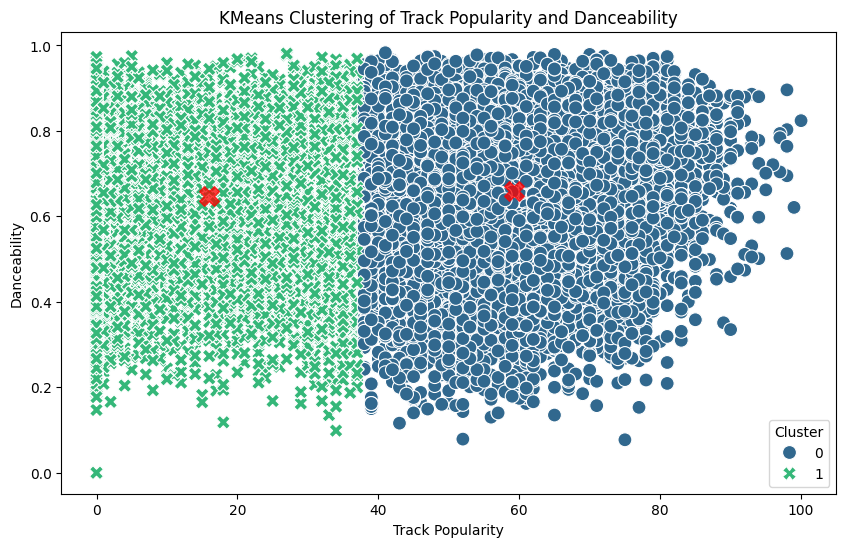

In [84]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='track_popularity', y='danceability', hue='track_popularity_danceability_cluster', data=df, palette='viridis', style='track_popularity_danceability_cluster', s=100)


kmeans.fit_predict(df[['track_popularity', 'danceability']])
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='X')

plt.title('KMeans Clustering of Track Popularity and Danceability')
plt.xlabel('Track Popularity')
plt.ylabel('Danceability')
plt.legend(title='Cluster', loc='best')

plt.show()

##### **C.e.** Then, identify the optimal number of clusters, and rerun KMeans for the optimal number. 

In [85]:
inertias = []
clusters_range = range(1, 11)

for k in clusters_range:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df[['tempo', 'valence']])
    inertias.append(kmeans.inertia_)

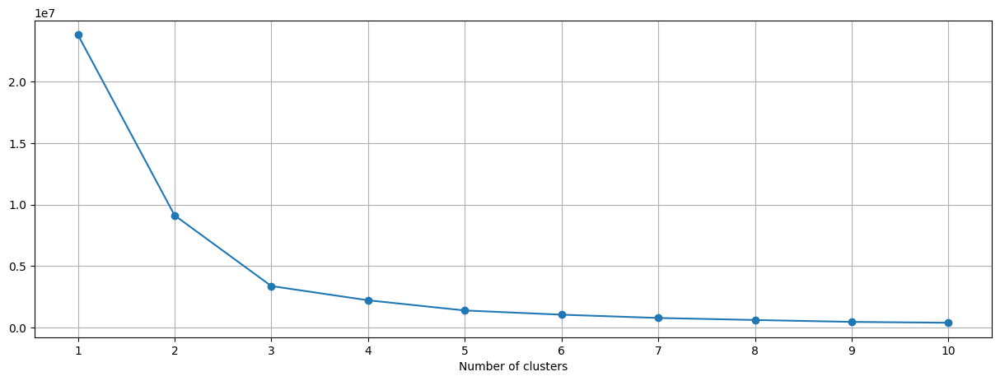

In [86]:
plt.figure(figsize=(15, 5))
plt.plot(clusters_range, inertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(clusters_range)
plt.grid(True)
plt.show()

In [87]:
inertias = []
clusters_range = range(1, 11)

for k in clusters_range:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df[['track_popularity', 'danceability']])
    inertias.append(kmeans.inertia_)

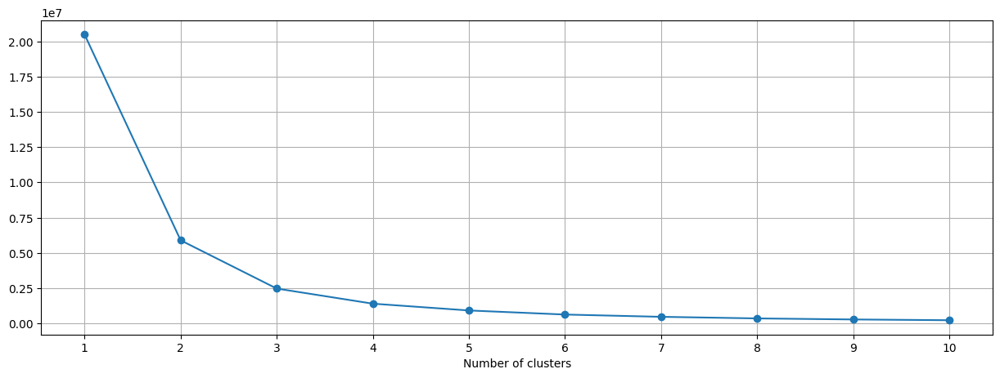

In [88]:
plt.figure(figsize=(15, 5))
plt.plot(clusters_range, inertias, marker='o')
plt.xlabel('Number of clusters')
plt.xticks(clusters_range)
plt.grid(True)
plt.show()

In [89]:
k = 5

kmeans = KMeans(n_clusters=k, random_state=0)
df['tempo_valence_cluster'] = kmeans.fit_predict(df[['tempo', 'valence']])
df['track_popularity_danceability_cluster'] = kmeans.fit_predict(df[['track_popularity', 'danceability']])

##### **C.e.i.** Count the number of observations per identified cluster.

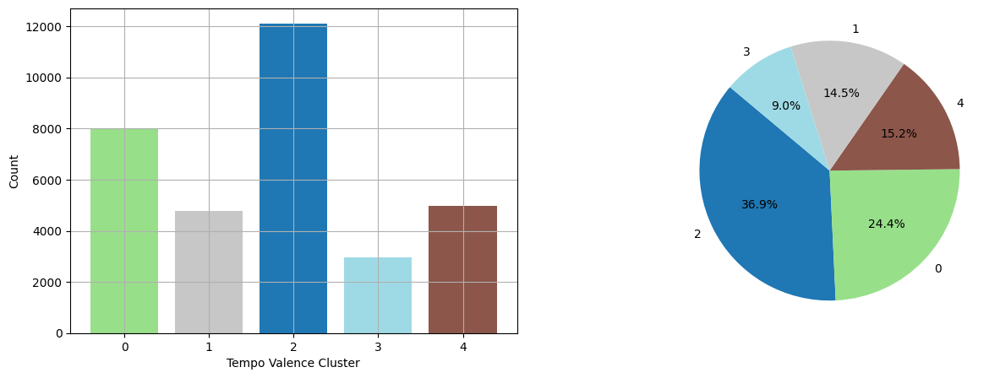

In [90]:
visualize_categories('tempo_valence_cluster', 'Tempo Valence Cluster')

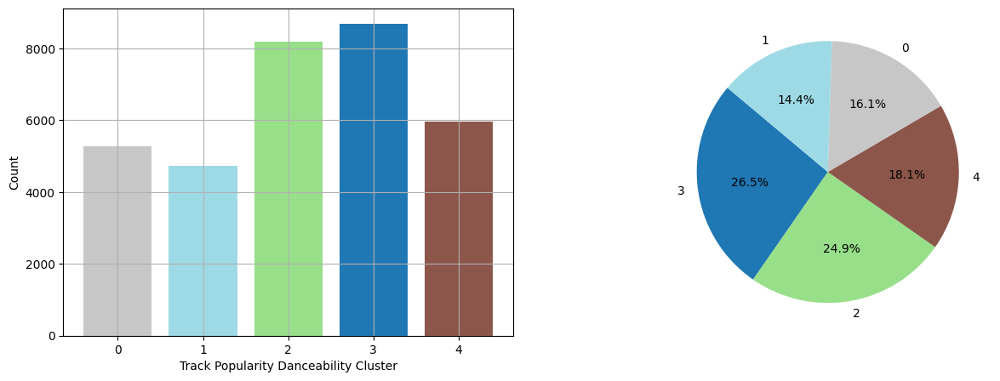

In [91]:
visualize_categories('track_popularity_danceability_cluster', 'Track Popularity Danceability Cluster')

##### **C.e.ii.** Visualize the cluster results between 2 of the variables used for the cluster analysis.

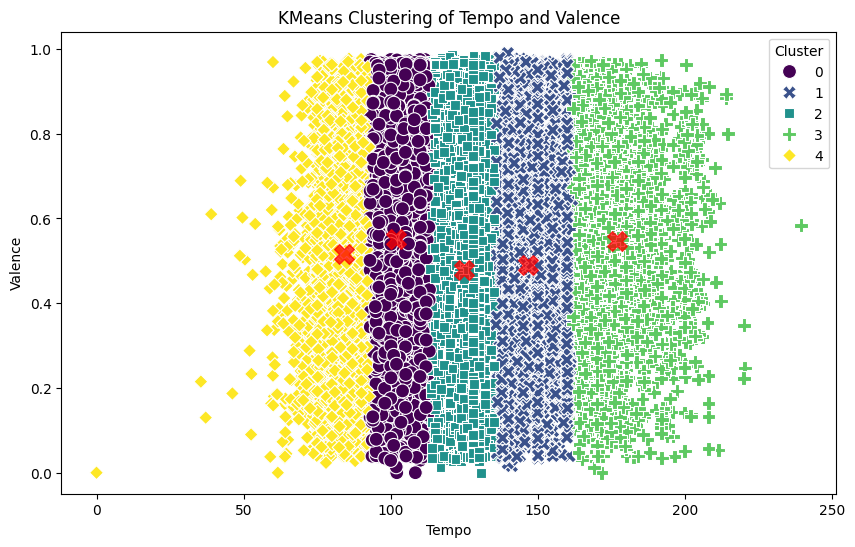

In [92]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='tempo', y='valence', hue='tempo_valence_cluster', data=df, palette='viridis', style='tempo_valence_cluster', s=100)

kmeans.fit_predict(df[['tempo', 'valence']])
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='X')

plt.title('KMeans Clustering of Tempo and Valence')
plt.xlabel('Tempo')
plt.ylabel('Valence')
plt.legend(title='Cluster', loc='best')

plt.show()

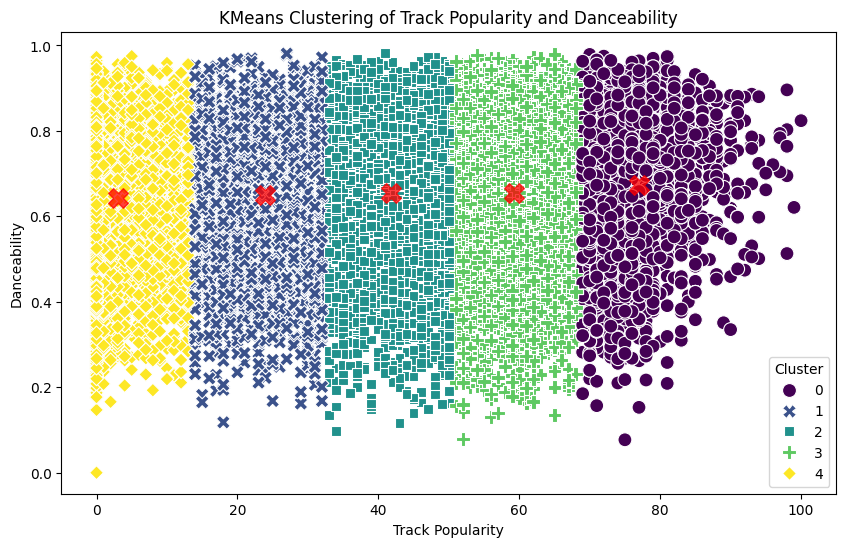

In [93]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='track_popularity', y='danceability', hue='track_popularity_danceability_cluster', data=df, palette='viridis', style='track_popularity_danceability_cluster', s=100)

kmeans.fit_predict(df[['track_popularity', 'danceability']])
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75, marker='X')

plt.title('KMeans Clustering of Track Popularity and Danceability')
plt.xlabel('Track Popularity')
plt.ylabel('Danceability')
plt.legend(title='Cluster', loc='best')

plt.show()

##### **C.f.i.2.** If you are working on a REGRESSION problem, are the identified clusters consistent with categories of a categorical input?

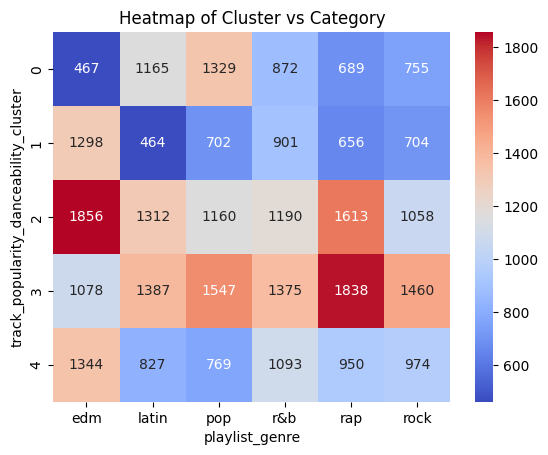

In [94]:
cross_tab = pd.crosstab(df['track_popularity_danceability_cluster'], df['playlist_genre'])

sns.heatmap(cross_tab, annot=True, cmap='coolwarm', fmt='g')
plt.title('Heatmap of Cluster vs Category')
plt.show()

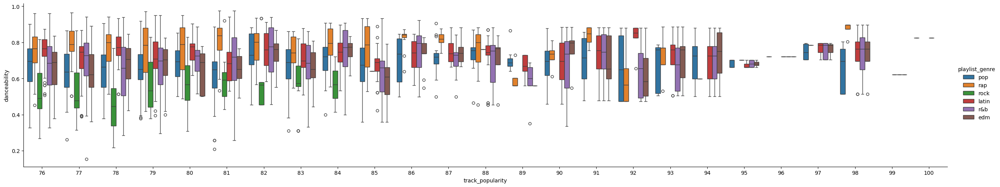

In [95]:
sns.catplot(data=df[df['track_popularity'] > 75], x='track_popularity', y='danceability', kind='box', hue='playlist_genre', aspect=5);

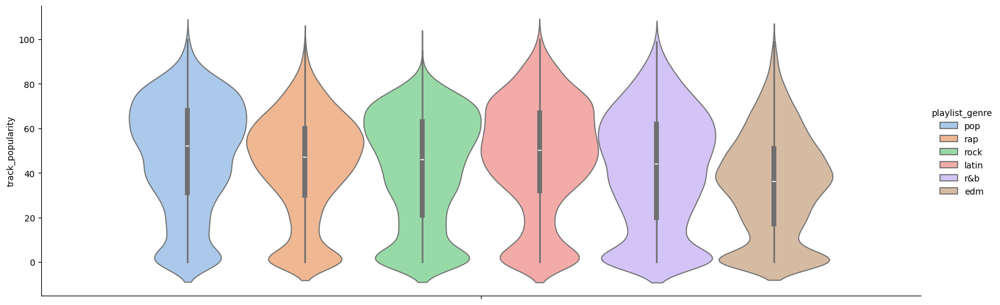

In [96]:
sns.catplot(data=df, y='track_popularity', kind='violin', hue='playlist_genre', aspect=3, palette='pastel');

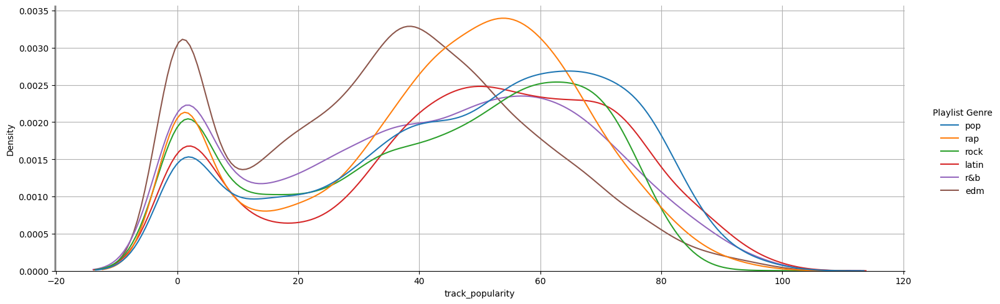

In [97]:
plot = sns.displot(data=df, x='track_popularity', hue='playlist_genre', kind='kde', height=5, aspect=3)

plot.axes[0, 0].set_xlabel('track_popularity')
plot.axes[0, 0].grid(True)
plot._legend.set_title('Playlist Genre')

plt.show()

<Axes: xlabel='playlist_genre', ylabel='track_popularity'>

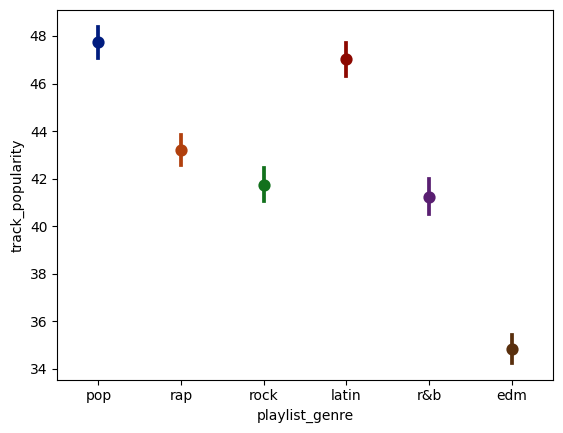

In [98]:
sns.pointplot(data=df, x='playlist_genre', y='track_popularity', palette='dark')

<div class="alert alert-block alert-success">
<b>Answer:</b> Yes, we can see that the 0 cluster, focusing on the most popular tracks, are composed of a higher number of Pop and Latin genre tracks. Seen above by a few visualizations, especially the point plot.
</div>

##### **C.f.ii.1.** Use appropriate visualizations to study the CONDITIONAL distributions of the variables used for clustering GROUPED BY the identified clusters.

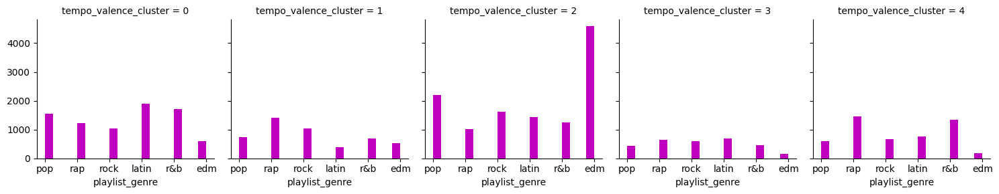

In [99]:
fg = sns.FacetGrid(df, col="tempo_valence_cluster", col_wrap=5, height=3)
fg.map(plt.hist, 'playlist_genre', bins=20, color='m')
plt.show()

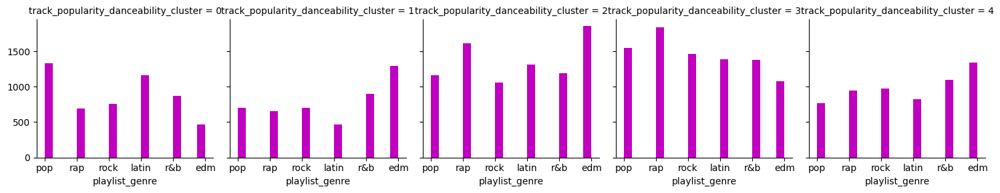

In [100]:
fg = sns.FacetGrid(df, col="track_popularity_danceability_cluster", col_wrap=5, height=3)
fg.map(plt.hist, 'playlist_genre', bins=20, color='m')
plt.show()

##### **A.a.** Are you working on a REGRESSION or CLASSIFICATION problem? 

<div class="alert alert-block alert-success">
<b>Answer:</b> Classification. I think I can classify which playlist subgenre a song will belong to based on features. 
</div>

##### **A.b.** Which variables are inputs? 

<div class="alert alert-block alert-success">
<b>Answer:</b> ['mode',
 'playlist_genre',
 'key',
 'playlist_subgenre',
 'track_popularity',
 'danceability',
 'energy',
 'speechiness',
 'valence',
 'liveness',
 'acousticness',
 'instrumentalness',
 'loudness',
 'tempo',
 'duration_ms'] to start, will look at feature permutation to see which I can toss out.
</div>

##### **A.c.** Which variables are responses/outputs/outcomes/targets?

<div class="alert alert-block alert-success">
<b>Answer:</b> playlist_subgenre
</div>

##### **A.d.** Did you need to DERIVE the responses of interest by SUMMARIZING the available data?

<div class="alert alert-block alert-success">
<b>Answer:</b> Certainly helped, probably could have chosen by eyeballing it though.
</div>

##### **A.e.** If so, what summary actions did you perform? 

<div class="alert alert-block alert-success">
<b>Answer:</b> Descriptive stats, visualizations, counted missing values, correlation analysis, etc.
</div>

##### **A.e.** Which variables are identifiers and should NOT be used in the models?

<div class="alert alert-block alert-success">
<b>Answer:</b> Columns not in all_primaries something like:
track_id,
track_name,
track_artist,
track_album_id,
track_album_name,
track_album_release_date,
playlist_name,
playlist_id
</div>

##### **A.g.i.** Which of the inputs do you think influence the response, based on your exploratory visualizations? Which exploratory visualization helped you identify potential input-to-output relationships? (If you are not sure which inputs seem to influence the response, it is okay to say so.)

<div class="alert alert-block alert-success">
<b>Answer:</b> Tempo is gonna be a big factor in determining which playlist subgenre it belongs to. I didn't decide on a classification model for subgenre until after I did the EDA, which is why this section is at the bottom. If I redid my EDA I would primarily focus on subgenre, but arriving at that decision is partly what EDA is for.
</div>

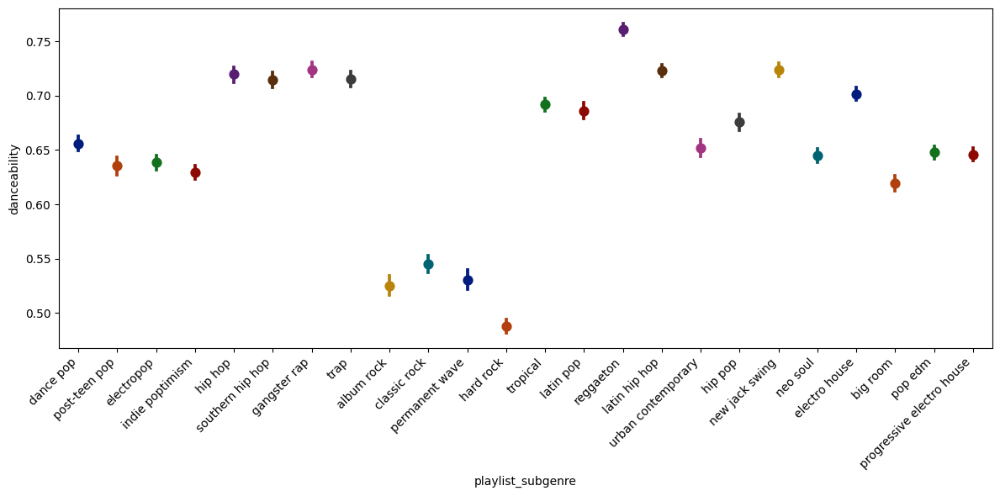

In [101]:
plt.figure(figsize=(12, 6))
ax = sns.pointplot(data=df, x='playlist_subgenre', y='danceability', palette='dark')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

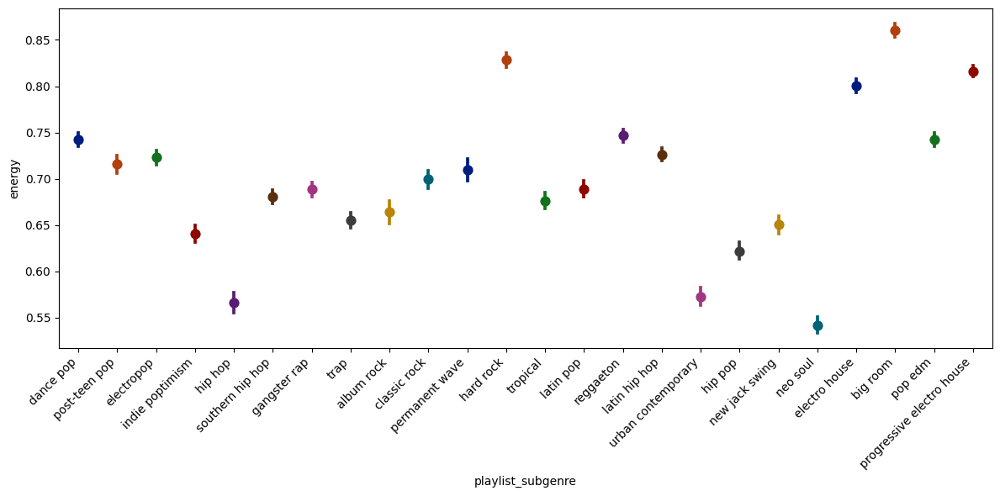

In [102]:
plt.figure(figsize=(12, 6))
ax = sns.pointplot(data=df, x='playlist_subgenre', y='energy', palette='dark')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

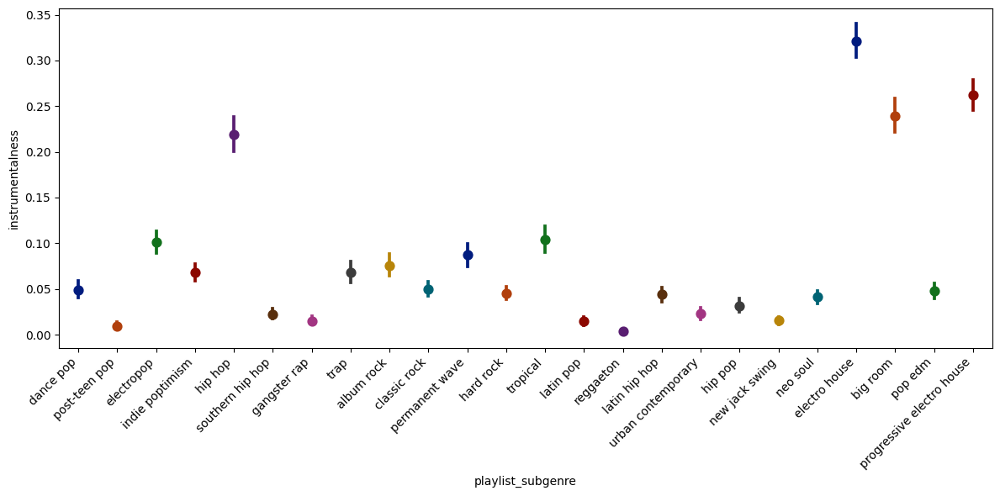

In [103]:
plt.figure(figsize=(12, 6))
ax = sns.pointplot(data=df, x='playlist_subgenre', y='instrumentalness', palette='dark')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()

<center><b>Time Required to Complete this Notebook - approx. 15 hours</b></center>

<center><b>Time Required to Run this Notebook - approx. 2 minutes</b></center>

<center><b>End</b></center>